In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import nltk
import locale
from locale import atof

In [2]:

df_World_Bank =pd.read_csv('C:/Users/Esme/Desktop/Springboard/Capstone_2/World_bank_USA/API_USA_DS2_en_csv_v2.csv', index_col = 0, header= 2, sep=",", engine = 'python', na_filter = False, thousands=',')

In [5]:
df_2016_unedited =pd.read_csv('C:/Users/Esme/Desktop/Springboard/Capstone_2/oesm16nat/oesm16nat/national_M2016_dl.csv', index_col = 0, header= 0, sep=",", engine = 'python', na_filter = False, thousands=',')
df_2015_unedited =pd.read_csv('C:/Users/Esme/Desktop/Springboard/Capstone_2/oesm15nat/oesm15nat/national_M2015_dl.csv', index_col = 0, header= 0, sep=",", engine = 'python', na_filter = False, thousands=',')
df_2014_unedited =pd.read_csv('C:/Users/Esme/Desktop/Springboard/Capstone_2/oesm14nat/oesm14nat/national_M2014_dl.csv', index_col = 0, header= 0, sep=",", engine = 'python', na_filter = False, thousands=',')
df_2013_unedited =pd.read_csv('C:/Users/Esme/Desktop/Springboard/Capstone_2/oesm13nat/oesm13nat/national_M2013_dl.csv', index_col = 0, header= 0, sep=",", engine = 'python', na_filter = False, thousands=',')
df_2012_unedited =pd.read_csv('C:/Users/Esme/Desktop/Springboard/Capstone_2/oesm12nat/oesm12nat/national_M2012_dl.csv', index_col = 0, header= 0, sep=",", engine = 'python', na_filter = False, thousands=',')
df_2011_unedited =pd.read_csv('C:/Users/Esme/Desktop/Springboard/Capstone_2/oesm11nat/national_M2011_dl.csv', index_col = 0, header= 0, sep=",", engine = 'python', na_filter = False, thousands=',')
df_2010_unedited =pd.read_csv('C:/Users/Esme/Desktop/Springboard/Capstone_2/oesm10nat/national_M2010_dl.csv', index_col = 0, header= 0, sep=",", engine = 'python', na_filter = False, thousands=',')
df_2009_unedited =pd.read_csv('C:/Users/Esme/Desktop/Springboard/Capstone_2/oesm09nat/national_dl.csv', index_col = 0, header= 0, sep=",", engine = 'python', na_filter = False, thousands=',')

df_2008_unedited =pd.read_csv('C:/Users/Esme/Desktop/Springboard/Capstone_2/oesm08nat/national__M2008_dl.csv', index_col = 0, header= 0, sep=",", engine = 'python', na_filter = False, thousands=',')
df_2007_unedited =pd.read_csv('C:/Users/Esme/Desktop/Springboard/Capstone_2/oesm07nat/national_May2007_dl.csv', index_col = 0, header= 0, sep=",", engine = 'python', na_filter = False, thousands=',')
df_2006_unedited =pd.read_csv('C:/Users/Esme/Desktop/Springboard/Capstone_2/oesm06nat/national_may2006_dl.csv', index_col = 0, header= 0, sep=",", engine = 'python', na_filter = False, thousands=',')
df_2005_unedited =pd.read_csv('C:/Users/Esme/Desktop/Springboard/Capstone_2/oesm05nat/national_may2005_dl.csv', index_col = 0, header= 0, sep=",", engine = 'python', na_filter = False, thousands=',')
df_2004_unedited =pd.read_csv('C:/Users/Esme/Desktop/Springboard/Capstone_2/oesm04nat/national_may2004_dl.csv', index_col = 0, header= 0, sep=",", engine = 'python', na_filter = False, thousands=',')
df_2003_unedited =pd.read_csv('C:/Users/Esme/Desktop/Springboard/Capstone_2/oesm03nat/national_may2003_dl.csv', index_col = 0, header= 0, sep=",", engine = 'python', na_filter = False, thousands=',')
df_2002_unedited =pd.read_csv('C:/Users/Esme/Desktop/Springboard/Capstone_2/oes02nat/national_2002_dl.csv', index_col = 0, header= 0, sep=",", engine = 'python', na_filter = False, thousands=',')


In [6]:
# function to clean up, set read-able column titles, and add year, so I can concatenate into one DF w/out loosing data


# function to clean up, set read-able column titles, and add year, so I can concatenate into one DF w/out loosing data
# function is allowing me stem and put all words in categories into lowercase, and translate needed numerical terms to numerical forms
# and create a employment percent column for each job type in the given year, before correlating all these DF into one doc

from nltk.stem import WordNetLemmatizer
from nltk.tokenize.moses import MosesDetokenizer
lemmatizer = nltk.stem.WordNetLemmatizer()
detokenizer = MosesDetokenizer()

def clean_labor_df(df, year):
    df= df.reset_index()
    df.columns= ['OCC_Code','Occupation_title','OCC_group', 'total_employment', 'Employment_RSE', 'mean_hourly_wage','mean_annual_wage', 'mean_wage_RSE', 'hourly_10th_percentile_wage', 'hourly_25th_percentile_wage', 'hourly_median_wage', 'hourly 75_percentile_wage', 'hourly_90th_percentile_wage', 'annual_10th_percentile_wage', 'annual_25th_percentile_wage', 'annual_median_percentile_wage', 'annual_75th_percentile_wage', 'annual_90th_percentile_wage', 'Annual:T/F', 'Wage:T/F' ]
    df['Year']= year
    df1= df.drop(['Annual:T/F', 'Wage:T/F'], axis=1)
    df2=df1.replace('**', np.nan)
    df3= df2.replace('#', np.nan)
    df3['total_employment']=pd.to_numeric(df3['total_employment'], errors='coerce', downcast='float')
    df3['mean_hourly_wage']= pd.to_numeric(df3['mean_hourly_wage'], errors='coerce', downcast='float')
    df3['mean_annual_wage']= pd.to_numeric(df3['mean_annual_wage'], errors='coerce', downcast='float')
    df3['hourly_median_wage']= pd.to_numeric(df3['hourly_median_wage'], errors='coerce', downcast='float')
    total_employ= df3['total_employment'][df3['Occupation_title']=='All Occupations']
    df3['job_employ_percent']= df3['total_employment']/ total_employ[0]
    # stem and tokenize jobt titles
    df3['Occupation_title'] = df3['Occupation_title'].str.lower()
    df3['Occupation_title'] = df3['Occupation_title'].apply(
        lambda x : x.split(" ")).apply(lambda x : [lemmatizer.lemmatize(y) for y in x])
    # detokenize titles
    df3['Occupation_title'] = df3['Occupation_title'].apply(lambda x :[detokenizer.detokenize(x, return_str=True)])
    df3['Occupation_title'] = df3['Occupation_title'].astype(str)
    df3['Occupation_title'] = df3['Occupation_title'].map(lambda x: x.lstrip("(){}[] ' ").
                                                   rstrip("''(){}[] "))
    
    
    return df3

In [7]:
# second function for  the multivalue index in 2006 data
def clean_labor_df2(df, year):
    df.columns= df.columns.get_level_values(0)
    df= df.reset_index()
    df.columns= ['OCC_Code','Occupation_title','OCC_group', 'total_employment', 'Employment_RSE', 'mean_hourly_wage','mean_annual_wage', 'mean_wage_RSE', 'hourly_10th_percentile_wage', 'hourly_25th_percentile_wage', 'hourly_median_wage', 'hourly 75_percentile_wage', 'hourly_90th_percentile_wage', 'annual_10th_percentile_wage', 'annual_25th_percentile_wage', 'annual_median_percentile_wage', 'annual_75th_percentile_wage', 'annual_90th_percentile_wage', 'Annual:T/F', 'Wage:T/F' ]
    df['Year']= year
    df1= df.drop(['Annual:T/F', 'Wage:T/F'], axis=1)
    df2=df1.replace('**', np.nan)
    df3= df2.replace('#', np.nan)
    df3['total_employment']=pd.to_numeric(df3['total_employment'], errors='coerce', downcast='float')
    df3['mean_hourly_wage']= pd.to_numeric(df3['mean_hourly_wage'], errors='coerce', downcast='float')
    df3['mean_annual_wage']= pd.to_numeric(df3['mean_annual_wage'], errors='coerce', downcast='float')
    df3['hourly_median_wage']= pd.to_numeric(df3['hourly_median_wage'], errors='coerce', downcast='float')
    total_employ= df3['total_employment'][df3['Occupation_title']=='All Occupations']
    df3['job_employ_percent']= df3['total_employment']/ total_employ[0]
    # stem and tokenize jobt titles
    df3['Occupation_title'] = df3['Occupation_title'].str.lower()
    df3['Occupation_title'] = df3['Occupation_title'].apply(
        lambda x : x.split(" ")).apply(lambda x : [lemmatizer.lemmatize(y) for y in x])
    # detokenize titles
    df3['Occupation_title'] = df3['Occupation_title'].apply(lambda x :[detokenizer.detokenize(x, return_str=True)])
    df3['Occupation_title'] = df3['Occupation_title'].astype(str)
    df3['Occupation_title'] = df3['Occupation_title'].map(lambda x: x.lstrip("(){}[] ' ").
                                                   rstrip("''(){}[] "))
    

    return df3

In [8]:
# second function for  the multivalue index and missing data in 2003 and 2002
def clean_labor_df3(df, year):

    df= df.reset_index()
    df.columns= ['OCC_Code','Occupation_title','OCC_group', 'total_employment', 'Employment_RSE', 'mean_hourly_wage','mean_annual_wage', 'mean_wage_RSE', 'hourly_10th_percentile_wage', 'hourly_25th_percentile_wage', 'hourly_median_wage', 'hourly 75_percentile_wage', 'hourly_90th_percentile_wage', 'annual_10th_percentile_wage', 'annual_25th_percentile_wage', 'annual_median_percentile_wage', 'annual_75th_percentile_wage', 'annual_90th_percentile_wage', 'Annual:T/F']
    df['Year']= year
    df1= df.drop(['Annual:T/F'], axis=1)
    df2=df1.replace('**', np.nan)
    df3= df2.replace('#', np.nan)
    df3['total_employment']=pd.to_numeric(df3['total_employment'], errors='coerce', downcast='float')
    df3['mean_hourly_wage']= pd.to_numeric(df3['mean_hourly_wage'], errors='coerce', downcast='float')
    df3['mean_annual_wage']= pd.to_numeric(df3['mean_annual_wage'], errors='coerce', downcast='float')
    df3['hourly_median_wage']= pd.to_numeric(df3['hourly_median_wage'], errors='coerce', downcast='float')
    total_employ= df3['total_employment'][df3['Occupation_title']=='All Occupations']
    df3['job_employ_percent']= df3['total_employment']/ total_employ[0]
        # stem and tokenize jobt titles
    df3['Occupation_title'] = df3['Occupation_title'].str.lower()
    df3['Occupation_title'] = df3['Occupation_title'].apply(
        lambda x : x.split(" ")).apply(lambda x : [lemmatizer.lemmatize(y) for y in x])
    # detokenize titles
    df3['Occupation_title'] = df3['Occupation_title'].apply(lambda x :[detokenizer.detokenize(x, return_str=True)])
    df3['Occupation_title'] = df3['Occupation_title'].astype(str)
    df3['Occupation_title'] = df3['Occupation_title'].map(lambda x: x.lstrip("(){}[] ' ").
                                                   rstrip("''(){}[] "))
    

    return df3

In [9]:
df_2016= clean_labor_df(df_2016_unedited, '2016')
df_2015= clean_labor_df(df_2015_unedited, '2015')
df_2014= clean_labor_df(df_2014_unedited, '2014')
df_2013= clean_labor_df(df_2013_unedited, '2013')
df_2012= clean_labor_df(df_2012_unedited, '2012')
df_2011= clean_labor_df(df_2011_unedited, '2011')
df_2010= clean_labor_df(df_2010_unedited, '2010')
df_2009= clean_labor_df(df_2009_unedited, '2009')
df_2008= clean_labor_df(df_2008_unedited, '2008')
df_2007= clean_labor_df(df_2007_unedited, '2007')
df_2006= clean_labor_df2(df_2006_unedited, '2006')
df_2005= clean_labor_df(df_2005_unedited, '2005')
df_2004= clean_labor_df(df_2004_unedited, '2004')
df_2003= clean_labor_df3(df_2003_unedited, '2003')
df_2002= clean_labor_df3(df_2002_unedited, '2002')

In [10]:
df_2002.head(3)

,OCC_Code,Occupation_title,OCC_group,total_employment,Employment_RSE,mean_hourly_wage,mean_annual_wage,mean_wage_RSE,hourly_10th_percentile_wage,hourly_25th_percentile_wage,hourly_median_wage,hourly 75_percentile_wage,hourly_90th_percentile_wage,annual_10th_percentile_wage,annual_25th_percentile_wage,annual_median_percentile_wage,annual_75th_percentile_wage,annual_90th_percentile_wage,Year,job_employ_percent
0,00-0000,all occupation,major,127523760.0,0.1,17.100000,35560.0,0.2,6.95,8.93,13.310000,20.84,31.2,14450,18580,27690,43340,64900,2002,1.000000
1,11-0000,management occupation,major,7092460.0,0.3,37.919998,78870.0,0.2,15.31,21.86,32.270000,46.79,69.53,31850,45470,67120,97320,144620,2002,0.055617
2,11-1011,chief executive,,452400.0,0.7,64.889999,134960.0,0.3,24.83,38.88,60.700001,NaN,NaN,51650,80860,126260,NaN,NaN,2002,0.003548


In [11]:
all_list= (df_2002, df_2003, df_2004, df_2005, df_2006, df_2007, df_2008, df_2009, df_2010, df_2011, df_2012, df_2013, df_2014, df_2015, df_2016)
df_all_labor= pd.concat(all_list)

Note for reference from Data source: 
occ_group: Shows the SOC occupation level: "total"=total of all occupations; "major"=SOC major group; "minor"=SOC minor group; "broad"=SOC broad occupation; "detailed"=SOC detailed occupation

In [12]:
df_all_labor['Occupation_title']

0                                          all occupation
1                                   management occupation
2                                         chief executive
3                           general and operation manager
4                                              legislator
5                       advertising and promotion manager
6                                       marketing manager
7                                            sale manager
8                                 public relation manager
9                          administrative service manager
10                computer and information system manager
11                                      financial manager
12                                 human resource manager
13                          industrial production manager
14                                     purchasing manager
15      transportation, storage, and distribution manager
16            farm, ranch, and other agricultural manager
17            

In [13]:
# isolating the total list by only the major job types
df_all_major= df_all_labor.loc[df_all_labor['OCC_group']== 'major' ]
df_all_broad= df_all_labor.loc[df_all_labor['OCC_group']== 'broad' ]

# Incorperate GDP data
isolate GDP from the world bank data by year, switch column and row, and join to existing df along year listing as GDP column

In [14]:
df_WB_GDP_unedited= df_World_Bank.loc[df_World_Bank['Indicator Name'] == 'GDP per capita (current US$)']
df_WB_GDP_growth_unedited= df_World_Bank.loc[df_World_Bank['Indicator Name'] == 'GDP growth (annual %)']
df_WB_GDP_worker_unedited= df_World_Bank.loc[df_World_Bank['Indicator Name'] == 'GDP per person employed (constant 2011 PPP $)']


df_WB_selfemployed_per_unedited= df_World_Bank.loc[df_World_Bank['Indicator Name'] == 'Self-employed, total (% of total employment) (modeled ILO estimate)']
df_WB_maleselfemployed_per_unedited= df_World_Bank.loc[df_World_Bank['Indicator Name'] == 'Self-employed, male (% of male employment) (modeled ILO estimate)']
df_WB_femaleselfemployed_per_unedited= df_World_Bank.loc[df_World_Bank['Indicator Name'] == 'Self-employed, female (% of female employment) (modeled ILO estimate)']

df_WB_unemploymentper_unedited= df_World_Bank.loc[df_World_Bank['Indicator Name'] == 'Unemployment, total (% of total labor force) (national estimate)']
df_WB_male_unemploymentper_unedited= df_World_Bank.loc[df_World_Bank['Indicator Name'] == 'Unemployment, male (% of male labor force) (national estimate)']
df_WB_female_unemploymentper_unedited= df_World_Bank.loc[df_World_Bank['Indicator Name'] == 'Unemployment, female (% of female labor force) (national estimate)']


In [15]:
# clean and transpose the DF so years are rows then concat into one DF
def clean_WB(df):
    df.columns= df.columns.get_level_values(0)
    df1= df.reset_index()
    df2= df1.drop(['Indicator Code', 'Country Code', 'Country Name'], axis= 1)
    df3= df2.transpose()
    return df3    

In [16]:
df_WB1= clean_WB(df_WB_GDP_unedited)
df_WB2= clean_WB(df_WB_GDP_growth_unedited)
df_WB3= clean_WB(df_WB_GDP_worker_unedited)

df_WB4= clean_WB(df_WB_selfemployed_per_unedited)
df_WB5= clean_WB(df_WB_maleselfemployed_per_unedited)
df_WB6=clean_WB(df_WB_femaleselfemployed_per_unedited)

df_WB7=clean_WB(df_WB_unemploymentper_unedited)
df_WB8=clean_WB(df_WB_male_unemploymentper_unedited)
df_WB9=clean_WB(df_WB_female_unemploymentper_unedited)

In [17]:
all_df= [df_WB1, df_WB2, df_WB3, df_WB4, df_WB5, df_WB6, df_WB7, df_WB8, df_WB9]

df_WB_GDP_plus= pd.concat(all_df, axis=1, join='inner')
df_WB_GDP_plus= df_WB_GDP_plus.drop(df_WB_GDP_plus.index[0])
df_WB_GDP_plus= df_WB_GDP_plus.reset_index()
df_WB_GDP_plus= df_WB_GDP_plus.drop(df_WB_GDP_plus.index[::58])
df_WB_GDP_plus.columns= ('Year', 'GDP per capita (current US$)','GDP growth (annual %)', 'GDP per person employed (constant 2011 PPP$)', 
                        '% of self-employed workers(all)', '% of self-employed male workers(% of all male workers)', 
                         '% of self-employed female workers (% of all female workers)', 'Unemployment, total (% of total labor force)', 
                        'Unemployment, male (% of male labor force)', 'Unemployment, female (% of female labor force)')
# only interestd in data from 2002 on
df_WB_GDP_recent= df_WB_GDP_plus.drop(df_WB_GDP_plus.index[0:42])
df_WB_GDP_recent

,Year,GDP per capita (current US$),GDP growth (annual %),GDP per person employed (constant 2011 PPP$),% of self-employed workers(all),% of self-employed male workers(% of all male workers),% of self-employed female workers (% of all female workers),"Unemployment, total (% of total labor force)","Unemployment, male (% of male labor force)","Unemployment, female (% of female labor force)"
43,2003,39677.1983481058,2.80677595648093,97912,11.3000001907349,13.8000001907349,8.30000019073486,6,6.30000019073486,5.69999980926514
44,2004,41921.8097617892,3.78574284969444,100435,11.1999998092651,13.8000001907349,8.30000019073486,5.5,5.59999990463257,5.40000009536743
45,2005,44307.9205848603,3.34521606334877,102124,11.1000003814697,13.6000003814697,8,5.09999990463257,5.09999990463257,5.09999990463257
46,2006,46437.0671173065,2.666625826122,103062,10.8999996185303,13.3999996185303,8,4.59999990463257,4.59999990463257,4.59999990463257
47,2007,48061.5376613353,1.77857023965289,104015,10.6999998092651,13.1000003814697,7.80000019073486,4.59999990463257,4.69999980926514,4.5
48,2008,48401.4273403899,-0.291621458693953,103863,10.3999996185303,12.8999996185303,7.5,5.80000019073486,6.09999990463257,5.40000009536743
49,2009,47001.5553496818,-2.77552957416808,104800,10.6000003814697,13.1000003814697,7.69999980926514,9.19999980926514,10.3000001907349,8.10000038146973
50,2010,48373.8788155779,2.53192061616315,107956,10.6999998092651,13.1999998092651,7.80000019073486,9.60000038146973,10.5,8.60000038146973
51,2011,49790.6654782305,1.60145467247139,108733,10.3999996185303,12.8000001907349,7.59999990463257,9,9.39999961853027,8.5
52,2012,51450.1222950581,2.22403085385714,109261,10.3999996185303,12.6000003814697,7.80000019073486,8.10000038146973,8.19999980926514,7.90000009536743


In [18]:
df_WB_GDP_recent.head(1)

,Year,GDP per capita (current US$),GDP growth (annual %),GDP per person employed (constant 2011 PPP$),% of self-employed workers(all),% of self-employed male workers(% of all male workers),% of self-employed female workers (% of all female workers),"Unemployment, total (% of total labor force)","Unemployment, male (% of male labor force)","Unemployment, female (% of female labor force)"
43,2003,39677.1983481058,2.80677595648093,97912,11.3000001907349,13.8000001907349,8.30000019073486,6,6.30000019073486,5.69999980926514


In [19]:
df_WB_GDP_recent['GDP per capita (current US$)']= pd.to_numeric(df_WB_GDP_recent['GDP per capita (current US$)'], errors='coerce', downcast='float')
df_WB_GDP_recent['GDP growth (annual %)']= pd.to_numeric(df_WB_GDP_recent['GDP growth (annual %)'], errors='coerce')
df_WB_GDP_recent['GDP per person employed (constant 2011 PPP$)']= pd.to_numeric(df_WB_GDP_recent['GDP per person employed (constant 2011 PPP$)'], errors='coerce')

df_WB_GDP_recent['% of self-employed workers(all)']= pd.to_numeric(df_WB_GDP_recent['% of self-employed workers(all)'], errors='coerce')
df_WB_GDP_recent['% of self-employed male workers(% of all male workers)']= pd.to_numeric(df_WB_GDP_recent['% of self-employed male workers(% of all male workers)'], errors='coerce')
df_WB_GDP_recent['% of self-employed female workers (% of all female workers)']= pd.to_numeric(df_WB_GDP_recent['% of self-employed female workers (% of all female workers)'], errors='coerce')

df_WB_GDP_recent['Unemployment, total (% of total labor force)']= pd.to_numeric(df_WB_GDP_recent['Unemployment, total (% of total labor force)'], errors='coerce')
df_WB_GDP_recent['Unemployment, male (% of male labor force)']= pd.to_numeric(df_WB_GDP_recent['Unemployment, male (% of male labor force)'], errors='coerce')
df_WB_GDP_recent['Unemployment, male (% of female labor force)']= pd.to_numeric(df_WB_GDP_recent['Unemployment, female (% of female labor force)'], errors='coerce')
df_WB_GDP_recent.head(3)

,Year,GDP per capita (current US$),GDP growth (annual %),GDP per person employed (constant 2011 PPP$),% of self-employed workers(all),% of self-employed male workers(% of all male workers),% of self-employed female workers (% of all female workers),"Unemployment, total (% of total labor force)","Unemployment, male (% of male labor force)","Unemployment, female (% of female labor force)","Unemployment, male (% of female labor force)"
43,2003,39677.199219,2.806776,97912,11.3,13.8,8.3,6.0,6.3,5.69999980926514,5.7
44,2004,41921.808594,3.785743,100435,11.2,13.8,8.3,5.5,5.6,5.40000009536743,5.4
45,2005,44307.921875,3.345216,102124,11.1,13.6,8.0,5.1,5.1,5.09999990463257,5.1


In [20]:
df_GDP_salary= pd.merge(df_WB_GDP_recent, df_all_labor, left_on= 'Year', right_on='Year')

In [21]:
df_GDP_salary.head()

,Year,GDP per capita (current US$),GDP growth (annual %),GDP per person employed (constant 2011 PPP$),% of self-employed workers(all),% of self-employed male workers(% of all male workers),% of self-employed female workers (% of all female workers),"Unemployment, total (% of total labor force)","Unemployment, male (% of male labor force)","Unemployment, female (% of female labor force)",...,hourly_25th_percentile_wage,hourly_median_wage,hourly 75_percentile_wage,hourly_90th_percentile_wage,annual_10th_percentile_wage,annual_25th_percentile_wage,annual_median_percentile_wage,annual_75th_percentile_wage,annual_90th_percentile_wage,job_employ_percent
0,2003,39677.199219,2.806776,97912,11.3,13.8,8.3,6.0,6.3,5.69999980926514,...,9.08,13.530000,21.17,31.97,14640,18880,28140,44040,66500,1.000000
1,2003,39677.199219,2.806776,97912,11.3,13.8,8.3,6.0,6.3,5.69999980926514,...,23.14,34.070000,49.39,NaN,33590,48140,70870,102730,NaN,0.052156
2,2003,39677.199219,2.806776,97912,11.3,13.8,8.3,6.0,6.3,5.69999980926514,...,41.64,64.779999,NaN,NaN,55720,86620,134740,NaN,NaN,0.003056
3,2003,39677.199219,2.806776,97912,11.3,13.8,8.3,6.0,6.3,5.69999980926514,...,23.48,35.000000,54.20,NaN,34850,48840,72800,112730,NaN,0.014832
4,2003,39677.199219,2.806776,97912,11.3,13.8,8.3,6.0,6.3,5.69999980926514,...,6.42,7.900000,19.51,34.92,12220,13340,16440,40580,72630,0.000512


In [22]:
df_GDP_salary.columns

Index(['Year', 'GDP per capita (current US$)', 'GDP growth (annual %)',
       'GDP per person employed (constant 2011 PPP$)',
       '% of self-employed workers(all)',
       '% of self-employed male workers(% of all male workers)',
       '% of self-employed female workers (% of all female workers)',
       'Unemployment, total (% of total labor force)',
       'Unemployment, male (% of male labor force)',
       'Unemployment, female (% of female labor force)',
       'Unemployment, male (% of female labor force)', 'OCC_Code',
       'Occupation_title', 'OCC_group', 'total_employment', 'Employment_RSE',
       'mean_hourly_wage', 'mean_annual_wage', 'mean_wage_RSE',
       'hourly_10th_percentile_wage', 'hourly_25th_percentile_wage',
       'hourly_median_wage', 'hourly 75_percentile_wage',
       'hourly_90th_percentile_wage', 'annual_10th_percentile_wage',
       'annual_25th_percentile_wage', 'annual_median_percentile_wage',
       'annual_75th_percentile_wage', 'annual_90th_perc

# Next step of Analysis and Questions:

I am looking at two major questions at this point, with some follow-up and minor questions contained within each:

First, how have the number of jobs/ employment rate(by specific job titles) changed year- over-year alongside the national GDP, GDP growth rate or gender divide in industry.

Second, how have salaries shifted over the last 10 years for different job titles, specifically looking at job groups such as entry level, lower-level employee, mid-level, managerial or CEO- compared alongside the GDP or unemployment rate. I am also interesting in how the catntofies of technical jobs, verice service industry jobs have different salary ranges. 

-- With both of these questions we will have start with the bigger data- and then perhaps look at more specific results to see if there are data points of interest 


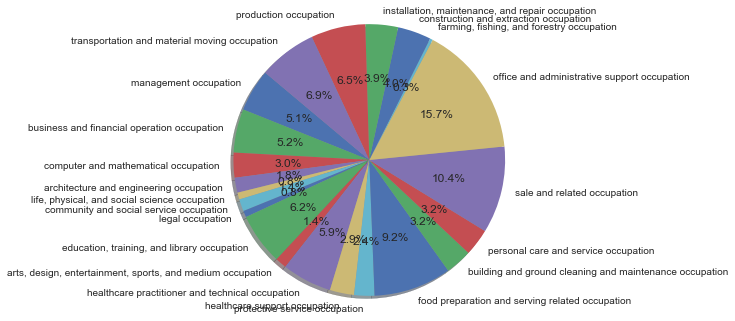

In [23]:
# pie plot to look at break down of all job types
major_2016= df_all_major.loc[df_all_major['Year']== '2016' ]
labels = major_2016['Occupation_title']
sizes = major_2016['total_employment']
explode = (0.1, 0, 0, 0)  # explode 1st slice
 
# Plot
plt.pie(sizes, labels=labels, 
        autopct='%1.1f%%', shadow=True, startangle=140)
 
plt.axis('equal')
plt.show()

In [24]:
# isolating the total list by only the major job types
df_G_s_major= df_GDP_salary.loc[df_GDP_salary['OCC_group']== 'major' ]
df_G_s_broad= df_GDP_salary.loc[df_GDP_salary['OCC_group']== 'broad' ]
df_G_s_detailed= df_GDP_salary.loc[df_GDP_salary['OCC_group']== 'detailed' ]

In [25]:
#putting job titles into lower case to avoid inaccurate representation

df_G_s_major['Occupation_title']= df_G_s_major['Occupation_title'].str.lower()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


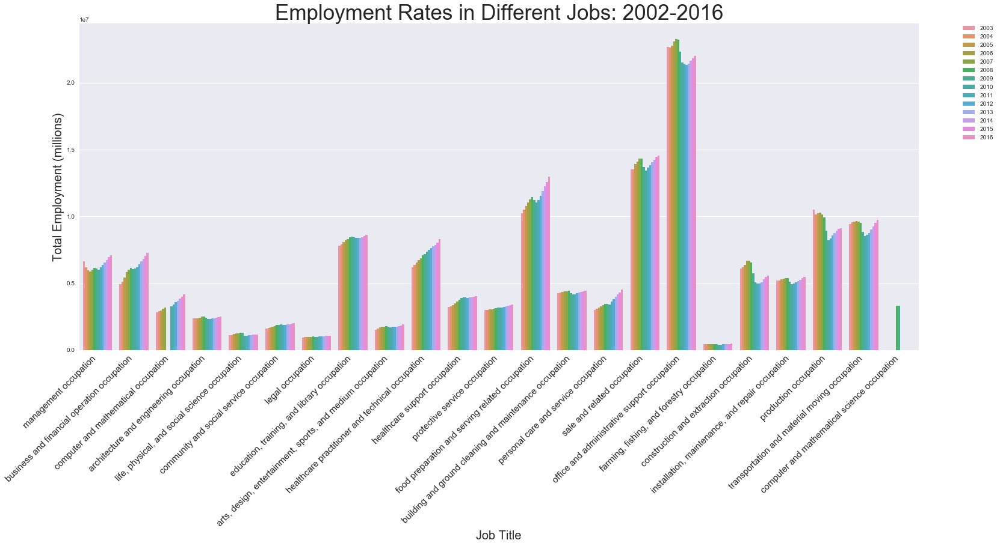

In [26]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 25
fig_size[1] = 10

g= sns.barplot(x= 'Occupation_title', y= 'total_employment', hue='Year' ,data=df_G_s_major)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=45, fontsize=15, ha='right')
plt.ylabel('Total Employment (millions)', fontsize= 20)
plt.title('Employment Rates in Different Jobs: 2002-2016', fontsize=35)
plt.xlabel('Job Title', fontsize=20)
plt.show()

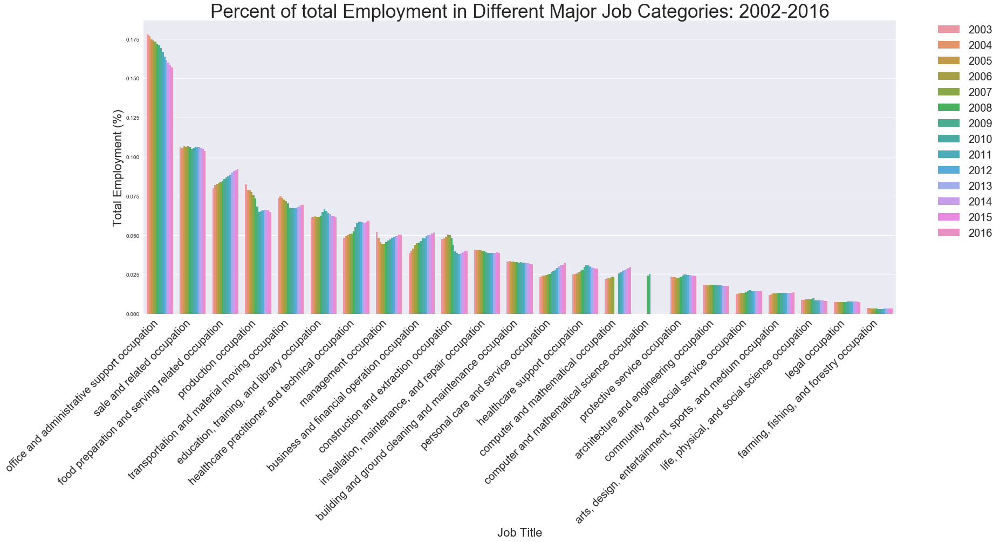

In [27]:
df_G_s_major= df_G_s_major.sort_values('job_employ_percent', ascending=False)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 25
fig_size[1] = 10


g= sns.barplot(x= 'Occupation_title', y= 'job_employ_percent', hue='Year' ,data=df_G_s_major)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize= 20)
plt.xticks( rotation=45, fontsize=20, ha='right')
plt.ylabel('Total Employment (%)', fontsize= 22)
plt.title('Percent of total Employment in Different Major Job Categories: 2002-2016', fontsize=35)
plt.xlabel('Job Title', fontsize= 22)
plt.show()

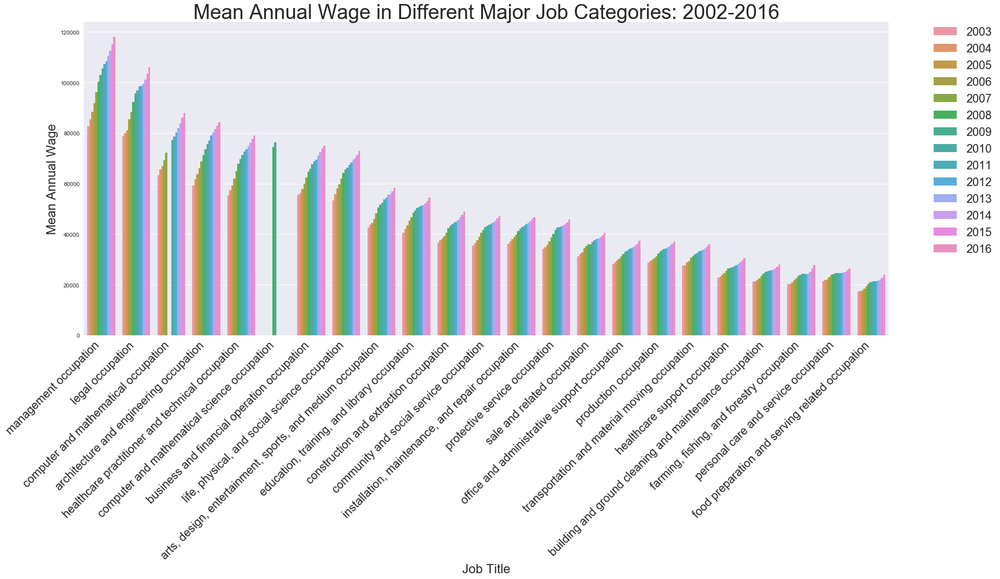

In [28]:
df_G_s_major= df_G_s_major.sort_values('mean_annual_wage', ascending=False)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 25
fig_size[1] = 10


g= sns.barplot(x= 'Occupation_title', y= 'mean_annual_wage', hue='Year' ,data=df_G_s_major)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize= 20)
plt.xticks( rotation=45, fontsize=20, ha='right')
plt.ylabel('Mean Annual Wage', fontsize= 22)
plt.title('Mean Annual Wage in Different Major Job Categories: 2002-2016', fontsize=35)
plt.xlabel('Job Title', fontsize= 22)
plt.show()

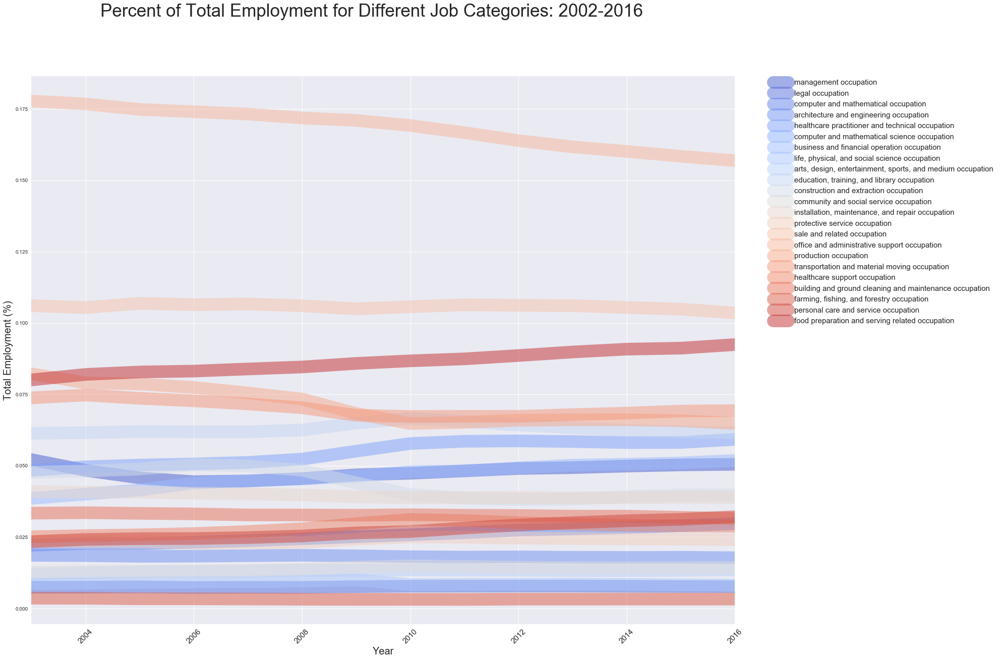

In [29]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 25
fig_size[1] = 20


sns.tsplot(time='Year', value= 'job_employ_percent', unit='Occupation_title',color='coolwarm',
           condition='Occupation_title', data=df_G_s_major, alpha=0.5, linewidth=25.0)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=15)
plt.xticks(rotation=45, fontsize=15)
plt.ylabel('Total Employment (%)', fontsize=20)
plt.suptitle('Percent of Total Employment for Different Job Categories: 2002-2016', fontsize=35)

plt.xlabel('Year', fontsize=20)
plt.show()

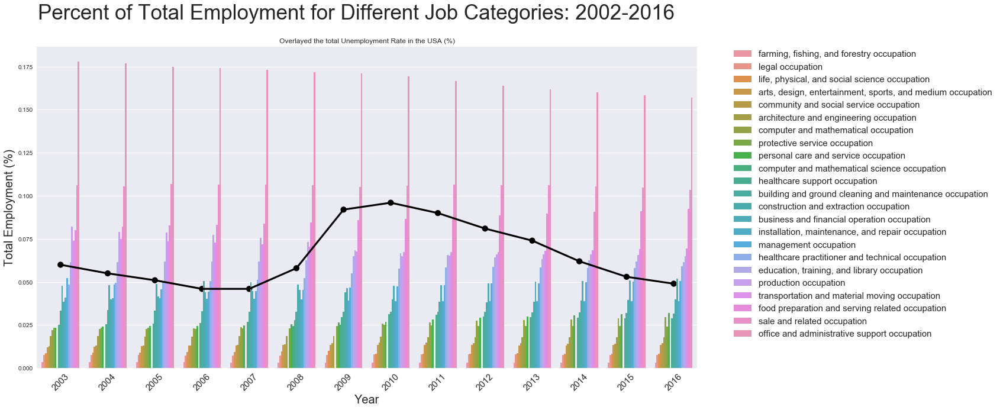

In [30]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 20
fig_size[1] = 10

Y=df_G_s_major['Unemployment, total (% of total labor force)']
df_G_s_major= df_G_s_major.sort_values('job_employ_percent')

sns.barplot(x='Year', y= 'job_employ_percent', hue='Occupation_title' ,data=df_G_s_major)
sns.pointplot(x='Year', y=Y*0.010, data=df_G_s_major, color='black', alpha=0.5)


plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=15)
plt.xticks(rotation=45, fontsize=15)
plt.ylabel('Total Employment (%)', fontsize=20)
plt.suptitle('Percent of Total Employment for Different Job Categories: 2002-2016', fontsize=35)
plt.title('Overlayed the total Unemployment Rate in the USA (%)')

plt.xlabel('Year', fontsize=20)
plt.show()

In [31]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 35
fig_size[1] = 10

Y=df_G_s_major['GDP per capita (current US$)']

sns.barplot(x='Year', y= 'total_employment', hue='Occupation_title' ,data=df_G_s_major)
sns.pointplot(x='Year', y=Y*250, data=df_G_s_major, color='black', alpha=0.5)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=15)
plt.xticks(rotation=, fontsize=20,)
plt.ylabel('Total Employment (million)', fontsize=20)
plt.suptitle('Employment Rates in Different Jobs: 2002-2016', fontsize=35)
plt.title('Overlayed with GDP per capita general rate', fontsize=30)
plt.xlabel('Year', fontsize=20)
plt.show()

SyntaxError: invalid syntax (<ipython-input-31-c56264f2ace2>, line 10)

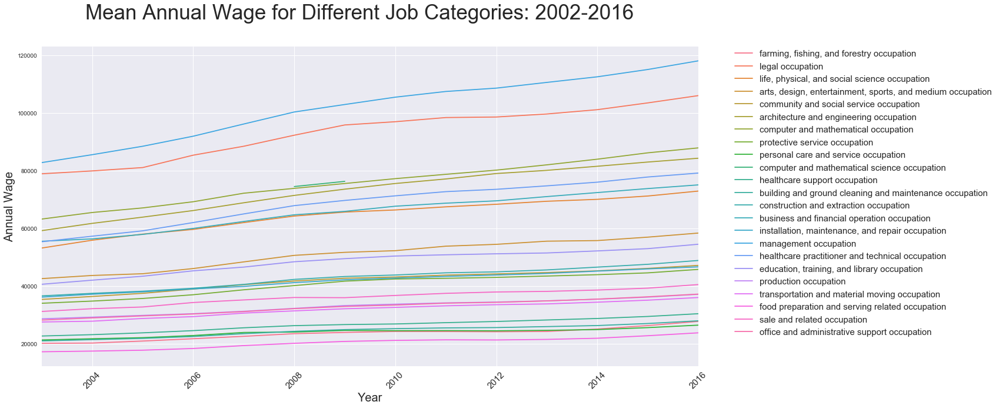

In [32]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 20
fig_size[1] = 10

Y=df_G_s_major['Unemployment, total (% of total labor force)']
df_G_s_major= df_G_s_major.sort_values('job_employ_percent')

sns.tsplot(time='Year', value= 'mean_annual_wage', unit='Occupation_title', condition='Occupation_title', 
           data=df_G_s_major)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=15)
plt.xticks(rotation=45, fontsize=15)
plt.ylabel('Annual Wage', fontsize=20)
plt.suptitle('Mean Annual Wage for Different Job Categories: 2002-2016', fontsize=35)

plt.xlabel('Year', fontsize=20)
plt.show()

# considering an index of Wage or income/ Employees in a given field

We are looking at macro-sized data, therefore we are looking at potential macro effects or reflections of the economic changes over the time-period in question. 

Therefore, we can look at the macro changes in job types and the effect that job type has on overall wage/salary for US workers. To do that I am looking at mean wage/ employment numbers in each category

In [33]:
df_major_indexs= df_G_s_major[['Occupation_title','mean_annual_wage', 'job_employ_percent', 'total_employment', 'Year']].copy()
df_major_indexs['Occupation_title'] = df_major_indexs['Occupation_title'].map(lambda x: x.rstrip('occupation'))
df_major_indexs["mean_employment"]= df_major_indexs['mean_annual_wage']/df_major_indexs['total_employment']
df_major_indexs["mean_percent"]= df_major_indexs['mean_annual_wage']/(df_major_indexs['job_employ_percent'])
df_major_indexs["percent_mean"]=df_major_indexs['job_employ_percent']/df_major_indexs['mean_annual_wage']
df_major_indexs["employment_mean"]=df_major_indexs['total_employment']/df_major_indexs['mean_annual_wage']

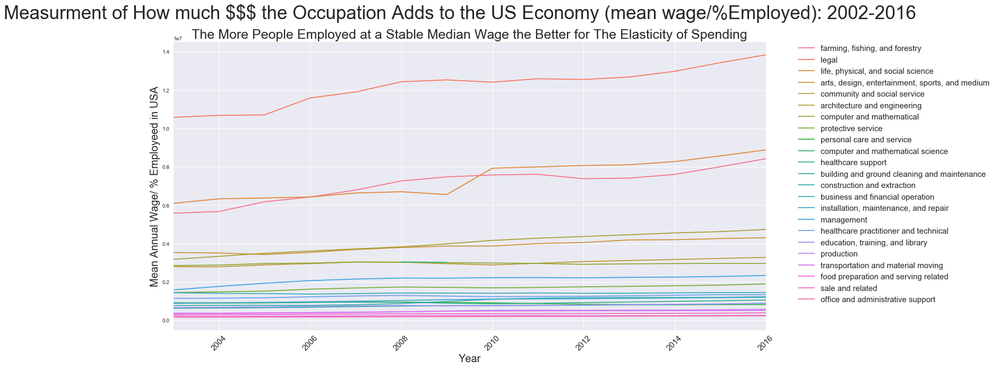

In [34]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 20
fig_size[1] = 10


sns.tsplot(time='Year', value= 'mean_percent', unit='Occupation_title', condition='Occupation_title', data=df_major_indexs)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=15)
plt.xticks(rotation=45, fontsize=15)
plt.ylabel('Mean Annual Wage/ % Employeed in USA', fontsize=20)
plt.suptitle('Measurment of How much $$$ the Occupation Adds to the US Economy (mean wage/%Employed): 2002-2016', fontsize=35)
plt.title('The More People Employed at a Stable Median Wage the Better for The Elasticity of Spending', fontsize= 25)

plt.xlabel('Year', fontsize=20)
plt.show()

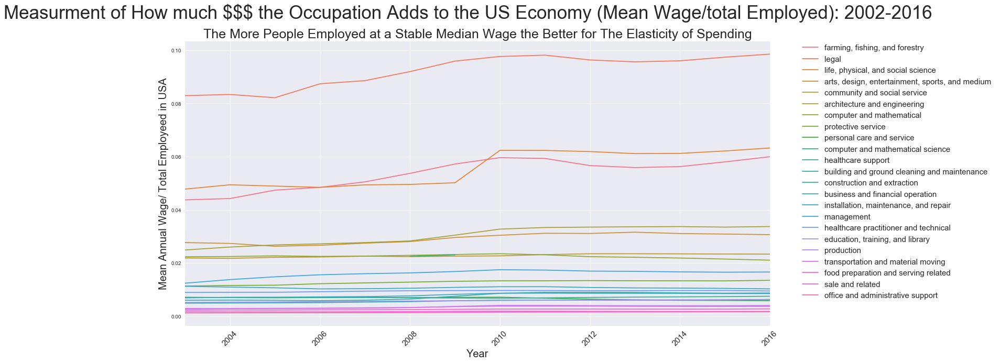

In [35]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 20
fig_size[1] = 10


sns.tsplot(time='Year', value= 'mean_employment', unit='Occupation_title', condition='Occupation_title', data=df_major_indexs)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=15)
plt.xticks(rotation=45, fontsize=15)
plt.ylabel('Mean Annual Wage/ Total Employeed in USA', fontsize=20)
plt.suptitle('Measurment of How much $$$ the Occupation Adds to the US Economy (Mean Wage/total Employed): 2002-2016', fontsize=35)
plt.title('The More People Employed at a Stable Median Wage the Better for The Elasticity of Spending', fontsize= 25)

plt.xlabel('Year', fontsize=20)
plt.show()

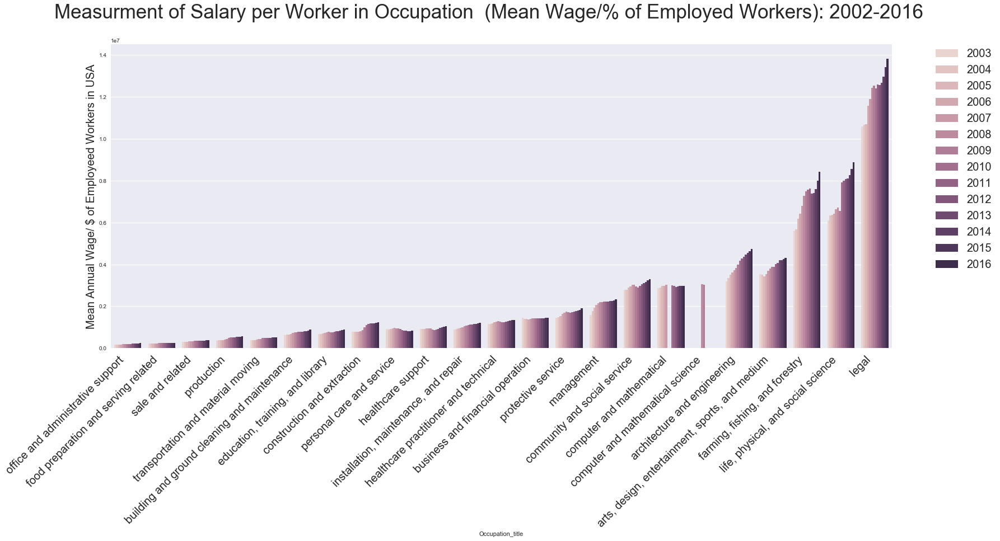

In [161]:
df_major_indexs= df_major_indexs.sort_values('mean_percent')

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 25
fig_size[1] = 10


g= sns.barplot(x= 'Occupation_title', y= 'mean_percent', hue='Year' ,data=df_major_indexs,
               palette= sns.cubehelix_palette(15))
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize= 20)
plt.xticks( rotation=45, fontsize=20, ha='right')
plt.ylabel('Mean Annual Wage/ $ of Employeed Workers in USA', fontsize=20)
plt.suptitle('Measurment of Salary per Worker in Occupation  (Mean Wage/% of Employed Workers): 2002-2016', fontsize=35)

plt.show()

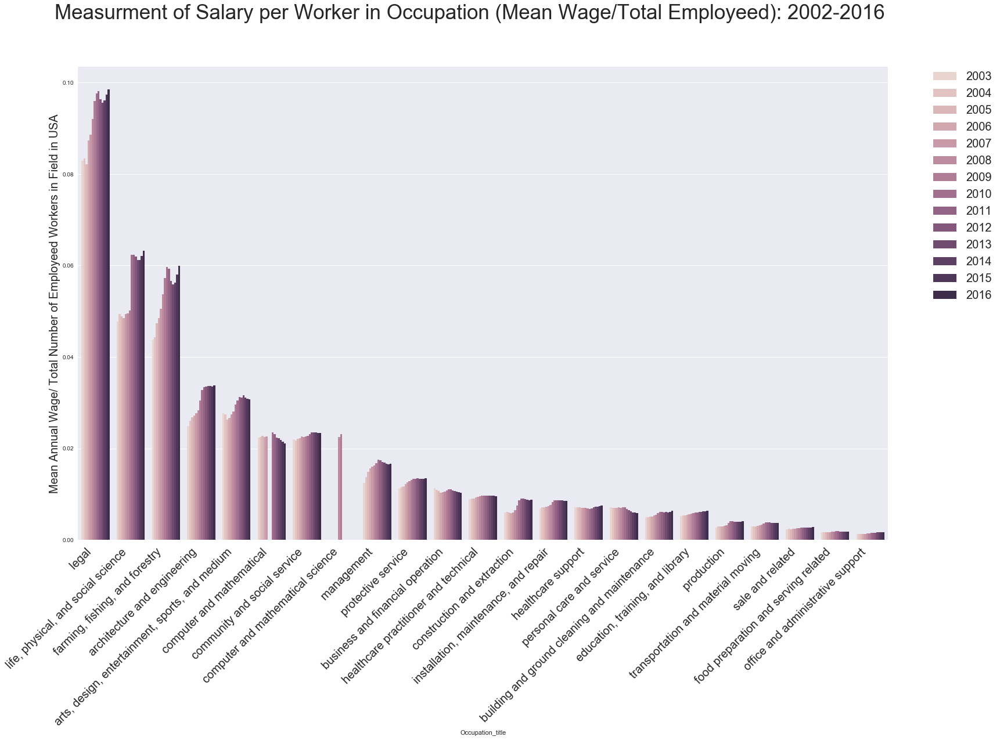

In [160]:
df_major_indexs= df_major_indexs.sort_values('mean_employment', ascending=False)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 25
fig_size[1] = 15


g= sns.barplot(x= 'Occupation_title', y= 'mean_employment', hue='Year' ,data=df_major_indexs,
               palette= sns.cubehelix_palette(15))
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize= 20)
plt.xticks( rotation=45, fontsize=20, ha='right')
plt.ylabel('Mean Annual Wage/ Total Number of Employeed Workers in Field in USA', fontsize=20)
plt.suptitle('Measurment of Salary per Worker in Occupation (Mean Wage/Total Employeed): 2002-2016', fontsize=35)
plt.show()

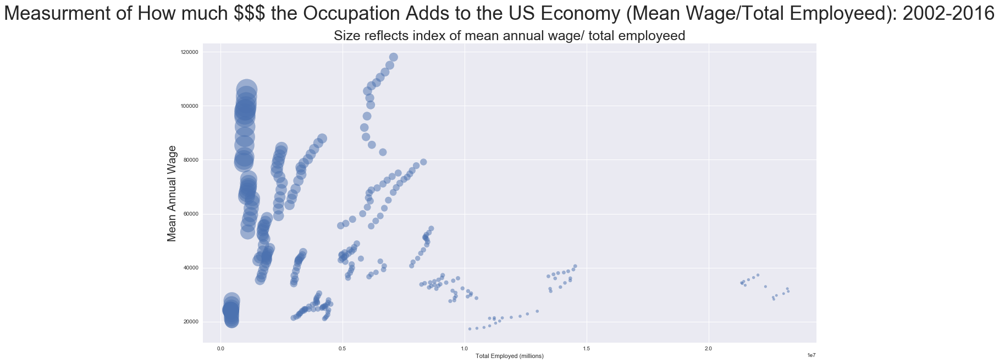

In [38]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 20
fig_size[1] = 10

X=df_major_indexs.total_employment
Y=df_major_indexs.mean_annual_wage
Z=df_major_indexs.Year
A=df_major_indexs.mean_employment


plt.scatter(x=X, y=Y, s=A*15000, alpha=0.5)
plt.xlabel('Total Employed (millions)')
plt.ylabel('Mean Annual Wage', fontsize=20)
plt.suptitle('Measurment of How much $$$ the Occupation Adds to the US Economy (Mean Wage/Total Employeed): 2002-2016', fontsize=35)
plt.title('Size reflects index of mean annual wage/ total employeed', fontsize= 25)

plt.show()

In [39]:
def overlaying_plotting2(df, x, y,z, label, color, year):
    df1=df.loc[df['Year']== year]
    df1=df1.reset_index()
    df1['Occupation_title']=df1['Occupation_title'].replace('occupation', '')
    X= df1[x]
    Y= df1[y]
    Z=df1[z]   
    n=df1[label]

    plt.scatter(x= X, y = Y,
                 s= 40000*Z, alpha=0.4, c= color)
    for i, txt in enumerate(n):
        ax.annotate(txt, xy= (X[i],Y[i]), xytext=(X[i]*1.02,Y[i]*1.03), fontsize= 12, clip_on=True)
        

In [40]:
def overlaying_plotting(df, x, y,z,label, color, year):
    df1=df.loc[df['Year']== year]
    X= df1[x]
    Y= df1[y]
    Z=df1[z]
    plt.scatter(x= X, y = Y,
                 s= 40000*Z, alpha=0.4, c= color)

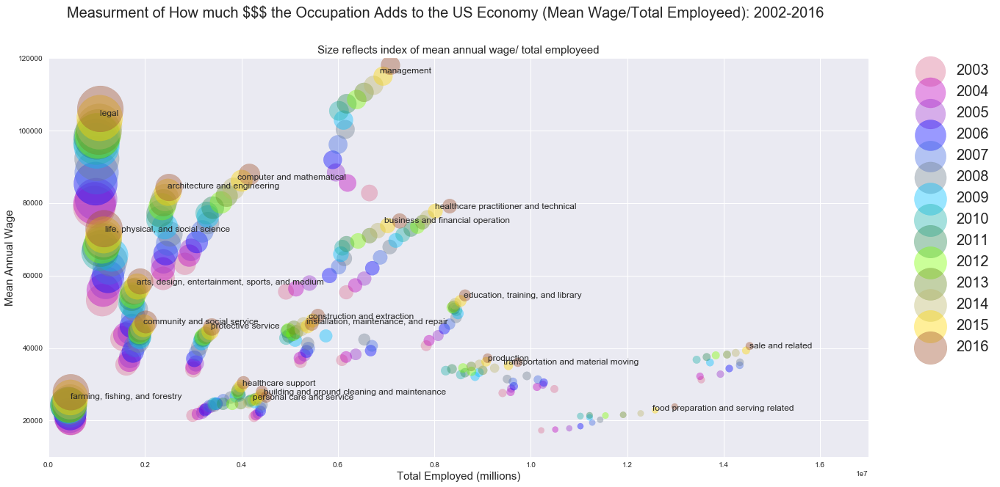

In [41]:

fig, ax= plt.subplots()
overlaying_plotting(df=df_major_indexs, x='total_employment', y='mean_annual_wage',z='mean_employment', 
                    label='Occupation_title', color='palevioletred', year='2003')
overlaying_plotting(df=df_major_indexs, x='total_employment', y='mean_annual_wage',z='mean_employment', 
                    label='Occupation_title', color='m', year='2004')
overlaying_plotting(df=df_major_indexs, x='total_employment', y='mean_annual_wage',z='mean_employment', 
                    label='Occupation_title', color='darkorchid', year='2005')
overlaying_plotting(df=df_major_indexs, x='total_employment', y='mean_annual_wage',z='mean_employment', 
                    label='Occupation_title', color='blue', year='2006')
overlaying_plotting(df=df_major_indexs, x='total_employment', y='mean_annual_wage',z='mean_employment', 
                    label='Occupation_title', color='royalblue', year='2007')
overlaying_plotting(df=df_major_indexs, x='total_employment', y='mean_annual_wage',z='mean_employment', 
                    label='Occupation_title', color='slategray', year='2008')
overlaying_plotting(df=df_major_indexs, x='total_employment', y='mean_annual_wage',z='mean_employment', 
                    label='Occupation_title', color='deepskyblue', year='2009')
overlaying_plotting(df=df_major_indexs, x='total_employment', y='mean_annual_wage',z='mean_employment', 
                    label='Occupation_title', color='lightseagreen', year='2010')
overlaying_plotting(df=df_major_indexs, x='total_employment', y='mean_annual_wage',z='mean_employment', 
                    label='Occupation_title', color='seagreen', year='2011')
overlaying_plotting(df=df_major_indexs, x='total_employment', y='mean_annual_wage',z='mean_employment', 
                    label='Occupation_title', color='chartreuse', year='2012')
overlaying_plotting(df=df_major_indexs, x='total_employment', y='mean_annual_wage',z='mean_employment', 
                    label='Occupation_title', color='olivedrab', year='2013')
overlaying_plotting2(df=df_major_indexs, x='total_employment', y='mean_annual_wage',z='mean_employment', 
                    label='Occupation_title', color='darkkhaki', year='2014')
overlaying_plotting(df=df_major_indexs, x='total_employment', y='mean_annual_wage',z='mean_employment', 
                    label='Occupation_title', color='gold', year='2015')
overlaying_plotting(df=df_major_indexs, x='total_employment', y='mean_annual_wage',z='mean_employment', 
                    label='Occupation_title', color='sienna', year='2016')


fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 18
fig_size[1] = 18
plt.xlabel('Total Employed (millions)', fontsize=15)
plt.ylabel('Mean Annual Wage', fontsize=15)
plt.suptitle('Measurment of How much $$$ the Occupation Adds to the US Economy (Mean Wage/Total Employeed): 2002-2016', fontsize=20)
plt.title('Size reflects index of mean annual wage/ total employeed', fontsize= 15)
plt.legend( ('2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016')
           , fontsize= 20, markerscale=1, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xlim(xmin=0, xmax=17000000)
plt.ylim(ymin=10000, ymax= 120000)


plt.show()

# thought
Even looking at just the major groups the exact rate of change in employment rates is hard to see. So what if I isolate only the major categories that account for 5% of the work force or more- and graph it. 

In [42]:
df_Gs_5per= df_G_s_major.loc[df_G_s_major['job_employ_percent'] >= 0.05]

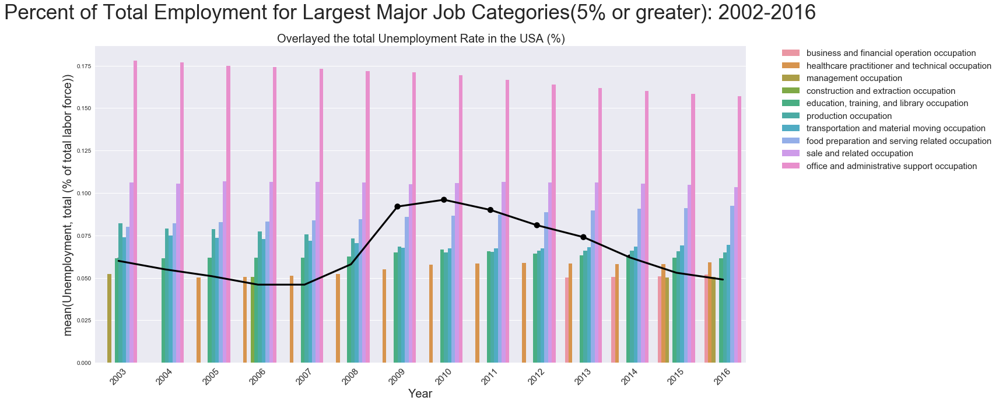

In [43]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 20
fig_size[1] = 10


df_Gs_5per= df_Gs_5per.sort_values('job_employ_percent')
Y=df_Gs_5per['Unemployment, total (% of total labor force)']

sns.barplot(x='Year', y= 'job_employ_percent', hue='Occupation_title' ,data=df_Gs_5per)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=15)
plt.xticks(rotation=45, fontsize=15)
plt.ylabel('Total Employment (%)', fontsize=20)

plt.suptitle('Percent of Total Employment for Largest Major Job Categories(5% or greater): 2002-2016', fontsize=35)
plt.title('Overlayed the total Unemployment Rate in the USA (%)', fontsize= 20)

sns.pointplot(x='Year', y=Y*0.010, data=df_G_s_major, color='black', alpha=0.5)

plt.xlabel('Year', fontsize=20)
plt.show()

# Consider Salaries by Job title over time

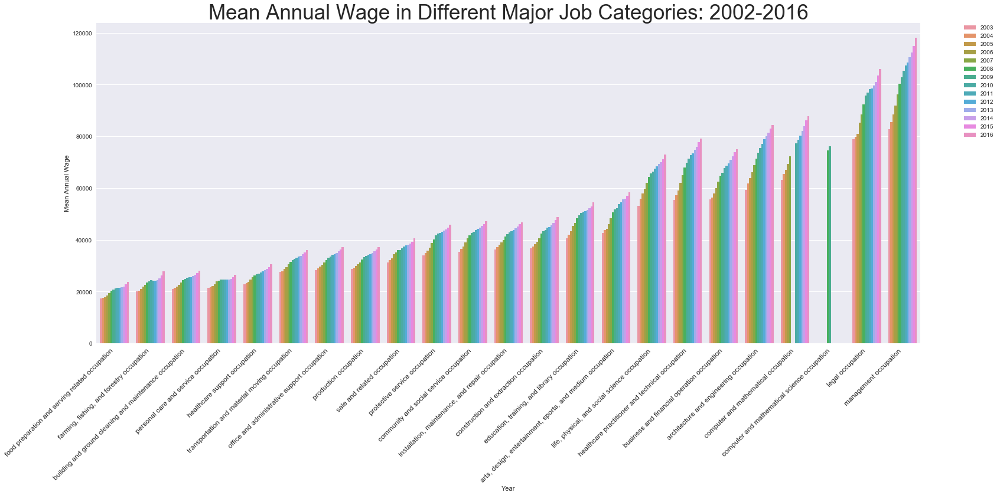

In [653]:
df_G_s_major= df_G_s_major.sort_values('job_employ_percent')

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 25
fig_size[1] = 10

df_G_s_major= df_G_s_major.sort_values('mean_annual_wage')

sns.barplot(x= 'Occupation_title', y= 'mean_annual_wage', hue='Year' ,data=df_G_s_major)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=45, fontsize=12, ha='right')
plt.ylabel('Mean Annual Wage')
plt.title('Mean Annual Wage in Different Major Job Categories: 2002-2016', fontsize=35)
plt.xlabel('Year')
plt.show()

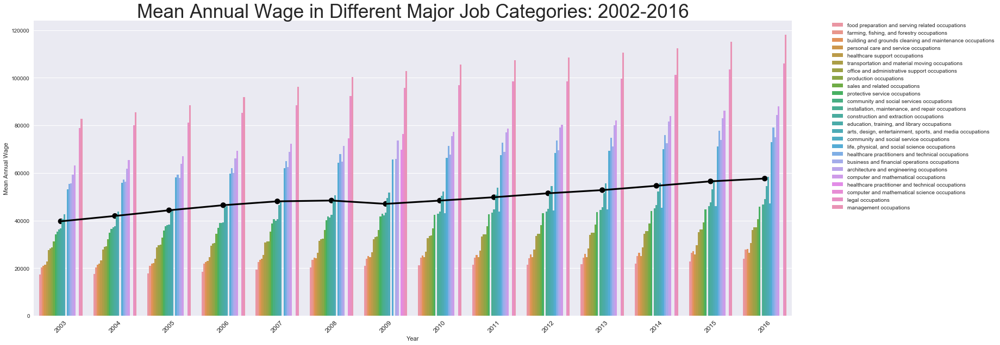

In [318]:
df_G_s_major= df_G_s_major.sort_values('job_employ_percent')

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 25
fig_size[1] = 10

Y=df_G_s_major['GDP per capita (current US$)']
Z=df_G_s_major['GDP growth (annual %)']

df_G_s_major= df_G_s_major.sort_values('mean_annual_wage')

sns.barplot(hue= 'Occupation_title', y= 'mean_annual_wage', x='Year' ,data=df_G_s_major)
sns.pointplot(x='Year', y=Y, data=df_G_s_major, color='black', alpha=0.5)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=45, fontsize=12)
plt.ylabel('Mean Annual Wage')
plt.title('Mean Annual Wage in Different Major Job Categories: 2002-2016', fontsize=35)
plt.xlabel('Year')
plt.show()

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


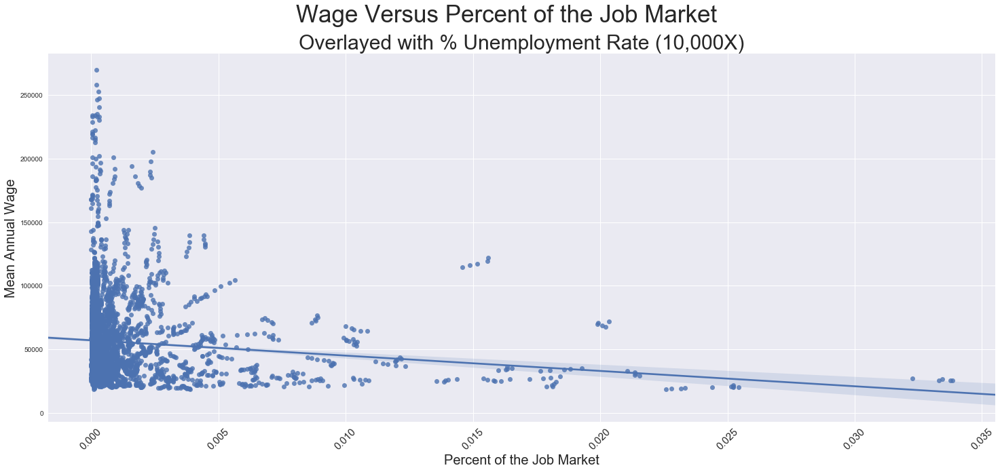

In [310]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 25
fig_size[1] = 10

Y=df_G_s_major['Unemployment, total (% of total labor force)']

sns.regplot(x='job_employ_percent',  y= 'mean_annual_wage', data=df_G_s_detailed)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=15)
plt.xticks(rotation=45, fontsize=15)
plt.xlabel('Percent of the Job Market', fontsize=20)
plt.suptitle('Wage Versus Percent of the Job Market', fontsize=35)
plt.title('Overlayed with % Unemployment Rate (10,000X)', fontsize=30)
plt.ylabel('Mean Annual Wage', fontsize=20)
plt.show()

In [44]:
df_upper_wage= df_G_s_detailed.loc[df_G_s_detailed['mean_annual_wage'] >=100000]
df_lower_01per= df_G_s_broad.loc[df_G_s_broad['job_employ_percent'] <= 0.001]
df_lower_001per= df_G_s_broad.loc[df_G_s_broad['job_employ_percent'] <= 0.0001]

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


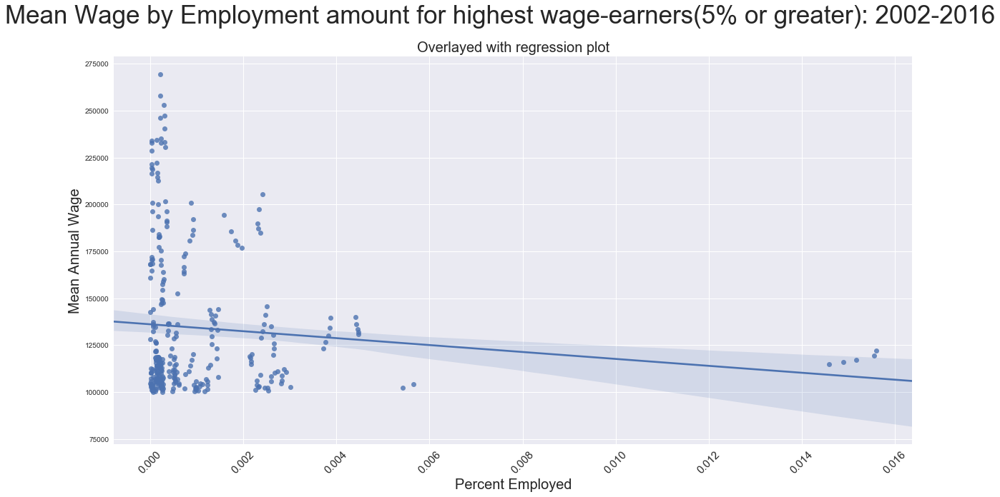

In [192]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 20
fig_size[1] = 10

sns.regplot(y='mean_annual_wage', x= 'job_employ_percent' ,data=df_upper_wage)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=15)
plt.xticks(rotation=45, fontsize=15)
plt.ylabel('Mean Annual Wage', fontsize=20)

plt.suptitle('Mean Wage by Employment amount for highest wage-earners(5% or greater): 2002-2016', fontsize=35)
plt.title('Overlayed with regression plot', fontsize= 20)

plt.xlabel('Percent Employed', fontsize=20)
plt.show()

#  Analysis Thoughts
1) although there was a big increase in unemployment in 2008-2010 That change seems to have been absorbed across multiple industries, and by looking at the graphs so far made, is not centered on one industry.

2) The industries with the greatest apparent loss in job numbers also appear to have the greatest gain in salaries.

3) There are a few industries that have undergone disruption in Employment numbers in the last few years



# Next Step
Sort the data by categorical groups and look at low, mid and high level jobs against each other. 

-- can I (easily) make percent change from one year to the next of salary?

# deep dive ideas: 
"office and administrative support occupation"

## "food preparation and serving related occupation" 
## "production occupation"
## "transportation and paterial moving occupation"
"healthcare practitioner and technical occupation"
 ## "management occupation"
## "construction and extraction occupation" --
"personal care and service occupation"
"computer and mathematical occupation"
"sale and related"
"farming, fishing & forestry"
"installation, maintenanceand repair"

Theory for categorizing/isolating futher- the full list (by initial index) is sorted by major cateegories and the corresponding detailed categories DIRECTLY BELOW that major category. 

Therefore, if I identify all the major category groups I can look at the Labor Bureru defined major/detailed groups within that cateogory for the "deep dive". 

I am using the names of the major categories isolated from the first group to identify and categorize the major and detailed groups

In [45]:
# isolating the total list by only the major job types
df_G_s_major= df_GDP_salary.loc[df_GDP_salary['OCC_group']== 'major' ]
df_G_s_broad= df_GDP_salary.loc[df_GDP_salary['OCC_group']== 'broad' ]
df_G_s_detailed= df_GDP_salary.loc[df_GDP_salary['OCC_group']== 'detailed' ]

In [56]:
df_all_index= df_GDP_salary[['Occupation_title','mean_annual_wage', 'job_employ_percent', 'total_employment', 
                              'Year', 'GDP per person employed (constant 2011 PPP$)', 'GDP per capita (current US$)',
                             'GDP growth (annual %)', 'Unemployment, total (% of total labor force)', 'OCC_group']].copy()

In [58]:
df_all_index["mean_employment"]= df_all_index['mean_annual_wage']/df_all_index['total_employment']
df_all_index["mean_percent"]= df_all_index['mean_annual_wage']/(df_all_index['job_employ_percent'])
df_all_index["percent_mean"]=df_all_index['job_employ_percent']/df_all_index['mean_annual_wage']
df_all_index["employment_mean"]=df_all_index['total_employment']/df_all_index['mean_annual_wage']
df_all_indexs= df_all_index.copy()
df_all_indexs['Occupation_title'] = df_all_indexs['Occupation_title'].map(lambda x: x.rstrip('occupation'))

In [139]:
df_bus_fin= df_all_indexs.iloc[31:58]
df_life_phys_soc_sci= df_all_indexs.iloc[74:106]
df_comm_soc_ser= df_all_indexs.iloc[107:142]
df_legal= df_all_indexs.iloc[143:156]
df_edu_lib= df_all_indexs.iloc[157:165]
df_art_design_entertain_spor= df_all_indexs.iloc[166:221]
df_health_pract_tech= df_all_indexs.iloc[222:255]
df_healthcare_support= df_all_indexs.iloc[256:299]
df_protec_serv= df_all_indexs.iloc[300:314]

In [165]:
# selected groups for deep dive- in just 2003 list

df_manag_03 =df_all_indexs.iloc[2:30]
df_off_admin_03= df_all_indexs.iloc[412:464]
df_food_prep_serv_03= df_all_indexs.iloc[334:349]

df_production_03= df_all_indexs.iloc[583:687] 
df_trans_material_moving_03= df_all_indexs.iloc[689:734]  
df_construct_03= df_all_indexs.iloc[478:532]  

df_pers_are_serv_03= df_all_indexs.iloc[359:390]  
df_comp_math_03=df_all_indexs.iloc[59:73]
df_sales_03=df_all_indexs.iloc[391:410]

df_farm_fish_forest_03=df_sales=df_all_indexs.iloc[465:476]
df_instal_repair_03=df_all_indexs.iloc[533:581]

In [166]:
# using titles for detailed and major groups within each group from the 2003 list above- to make the total list
df_manag= df_all_indexs[df_all_indexs['Occupation_title'].isin(df_manag_03['Occupation_title'])]
df_off_admin= df_all_indexs[df_all_indexs['Occupation_title'].isin(df_off_admin_03['Occupation_title'])]
df_food_prep_serv= df_all_indexs[df_all_indexs['Occupation_title'].isin(df_food_prep_serv_03['Occupation_title'])]

df_production= df_all_indexs[df_all_indexs['Occupation_title'].isin(df_production_03['Occupation_title'])]
df_trans_material_moving= df_all_indexs[df_all_indexs['Occupation_title'].isin(df_trans_material_moving_03['Occupation_title'])]
df_construct= df_all_indexs[df_all_indexs['Occupation_title'].isin(df_construct_03['Occupation_title'])]

df_pers_are_serv= df_all_indexs[df_all_indexs['Occupation_title'].isin(df_pers_are_serv_03['Occupation_title'])]
df_comp_math= df_all_indexs[df_all_indexs['Occupation_title'].isin(df_comp_math_03['Occupation_title'])]
df_sales= df_all_indexs[df_all_indexs['Occupation_title'].isin(df_sales_03['Occupation_title'])]

df_farm_fish_forest= df_all_indexs[df_all_indexs['Occupation_title'].isin(df_farm_fish_forest_03['Occupation_title'])]
df_instal_repair= df_all_indexs[df_all_indexs['Occupation_title'].isin(df_instal_repair_03['Occupation_title'])]


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


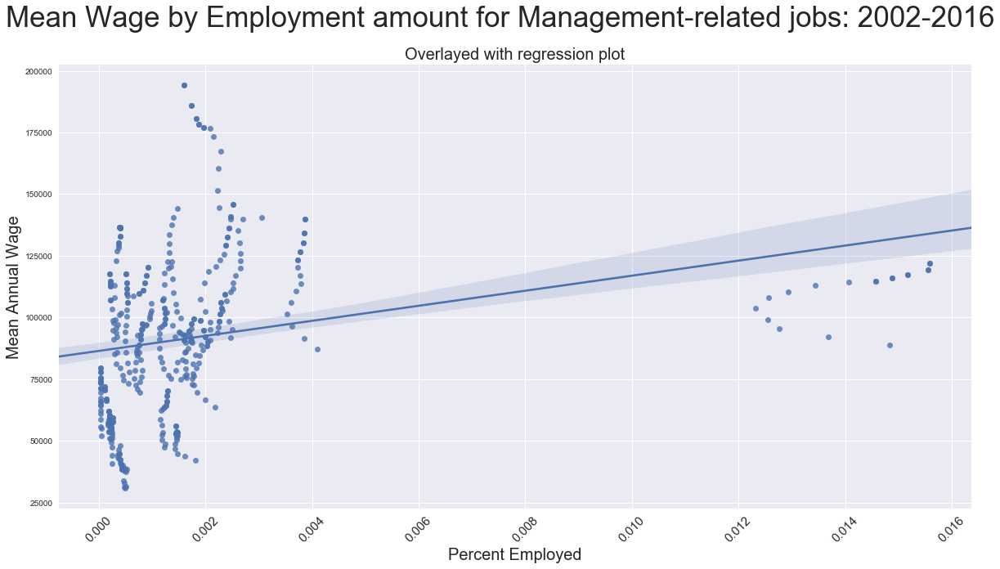

In [34]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 20
fig_size[1] = 10

sns.regplot(y='mean_annual_wage', x= 'job_employ_percent' ,data=df_manag)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=15)
plt.xticks(rotation=45, fontsize=15)
plt.ylabel('Mean Annual Wage', fontsize=20)

plt.suptitle('Mean Wage by Employment amount for Management-related jobs: 2002-2016', fontsize=35)
plt.title('Overlayed with regression plot', fontsize= 20)

plt.xlabel('Percent Employed', fontsize=20)
plt.show()

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


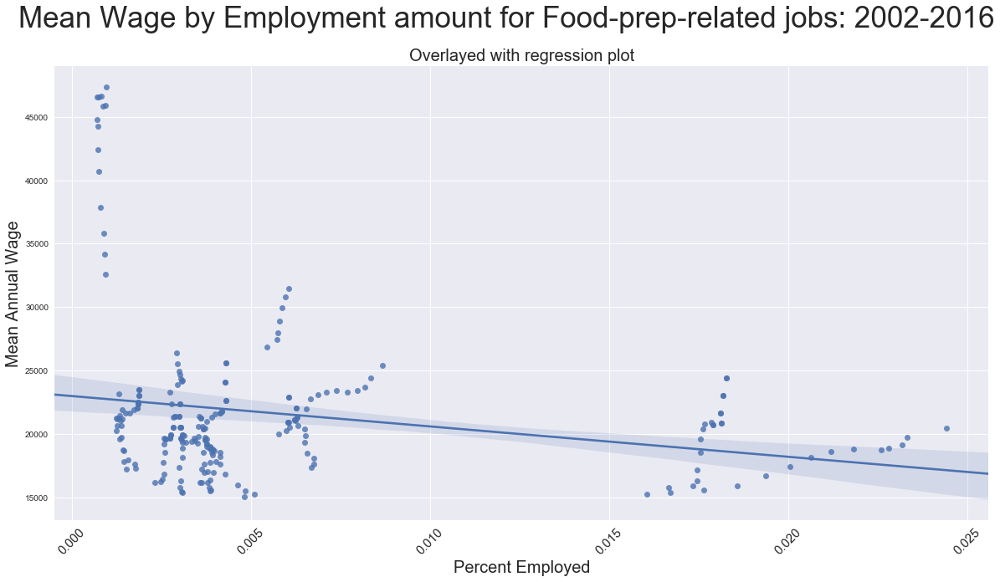

In [35]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 20
fig_size[1] = 10

sns.regplot(y='mean_annual_wage', x= 'job_employ_percent' ,data=df_food_prep_serv)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=15)
plt.xticks(rotation=45, fontsize=15)
plt.ylabel('Mean Annual Wage', fontsize=20)

plt.suptitle('Mean Wage by Employment amount for Food-prep-related jobs: 2002-2016', fontsize=35)
plt.title('Overlayed with regression plot', fontsize= 20)

plt.xlabel('Percent Employed', fontsize=20)
plt.show()

In [140]:
def overlaying_plotting2(df, x, y,z, label, color, year):
    df1=df.loc[df['Year']== year]
    df1=df1.reset_index()
    df1['Occupation_title']=df1['Occupation_title'].replace('occupation', '')
    X= df1[x]
    Y= df1[y]
    Z=df1[z]   
    n=df1[label]

    plt.scatter(x= X, y = Y,
                 s= 1000*Z, alpha=0.4, c= color)
    for i, txt in enumerate(n):
        ax.annotate(txt, xy= (X[i],Y[i]), xytext=(X[i]*1.02,Y[i]*1.03), fontsize= 12, clip_on=True)

In [141]:
def overlaying_plotting(df, x, y,z,label, color, year):
    df1=df.loc[df['Year']== year]
    X= df1[x]
    Y= df1[y]
    Z=df1[z]
    plt.scatter(x= X, y = Y,
                 s= 1000*Z, alpha=0.4, c= color)

In [142]:
def large_plot(df):
    overlaying_plotting(df=df, x='total_employment', y='mean_annual_wage',z='mean_employment', 
                    label='Occupation_title', color='palevioletred', year='2003')
    overlaying_plotting(df=df, x='total_employment', y='mean_annual_wage',z='mean_employment', 
                    label='Occupation_title', color='m', year='2004')
    overlaying_plotting(df=df, x='total_employment', y='mean_annual_wage',z='mean_employment', 
                    label='Occupation_title', color='darkorchid', year='2005')
    overlaying_plotting(df=df, x='total_employment', y='mean_annual_wage',z='mean_employment', 
                    label='Occupation_title', color='blue', year='2006')
    overlaying_plotting(df=df, x='total_employment', y='mean_annual_wage',z='mean_employment', 
                    label='Occupation_title', color='royalblue', year='2007')
    overlaying_plotting(df=df, x='total_employment', y='mean_annual_wage',z='mean_employment', 
                    label='Occupation_title', color='slategray', year='2008')
    overlaying_plotting(df=df, x='total_employment', y='mean_annual_wage',z='mean_employment', 
                    label='Occupation_title', color='deepskyblue', year='2009')
    overlaying_plotting(df=df, x='total_employment', y='mean_annual_wage',z='mean_employment', 
                    label='Occupation_title', color='lightseagreen', year='2010')
    overlaying_plotting(df=df, x='total_employment', y='mean_annual_wage',z='mean_employment', 
                    label='Occupation_title', color='seagreen', year='2011')
    overlaying_plotting(df=df, x='total_employment', y='mean_annual_wage',z='mean_employment', 
                    label='Occupation_title', color='chartreuse', year='2012')
    overlaying_plotting(df=df, x='total_employment', y='mean_annual_wage',z='mean_employment', 
                    label='Occupation_title', color='olivedrab', year='2013')
    overlaying_plotting2(df=df, x='total_employment', y='mean_annual_wage',z='mean_employment', 
                    label='Occupation_title', color='darkkhaki', year='2014')
    overlaying_plotting(df=df, x='total_employment', y='mean_annual_wage',z='mean_employment', 
                    label='Occupation_title', color='gold', year='2015')
    overlaying_plotting(df=df, x='total_employment', y='mean_annual_wage',z='mean_employment', 
                    label='Occupation_title', color='sienna', year='2016')


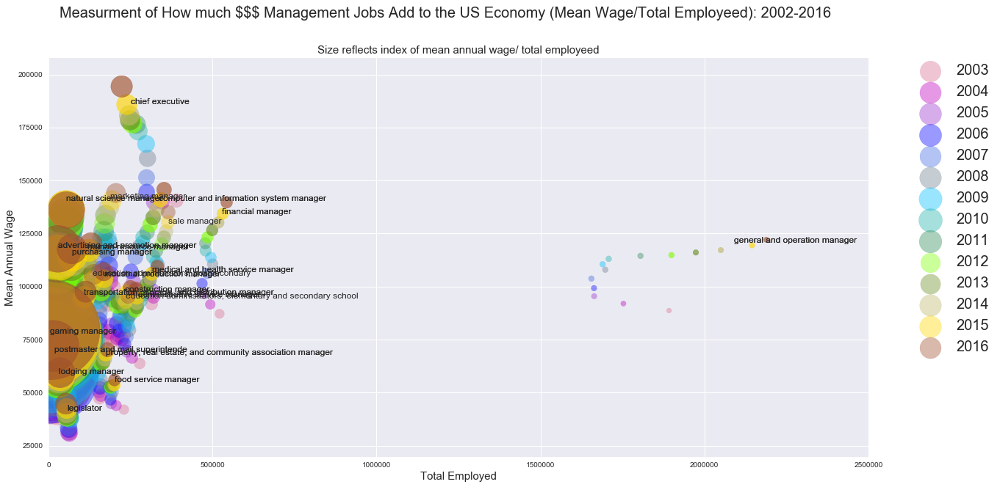

In [39]:

fig, ax= plt.subplots()

large_plot(df_manag)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 30
fig_size[1] = 20
plt.xlabel('Total Employed', fontsize=15)
plt.ylabel('Mean Annual Wage', fontsize=15)
plt.suptitle('Measurment of How much $$$ Management Jobs Add to the US Economy (Mean Wage/Total Employeed): 2002-2016', fontsize=20)
plt.title('Size reflects index of mean annual wage/ total employeed', fontsize= 15)
plt.legend( ('2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016')
           , fontsize= 20, markerscale=0.3, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xlim(xmin=0, xmax=2500000)
plt.show()

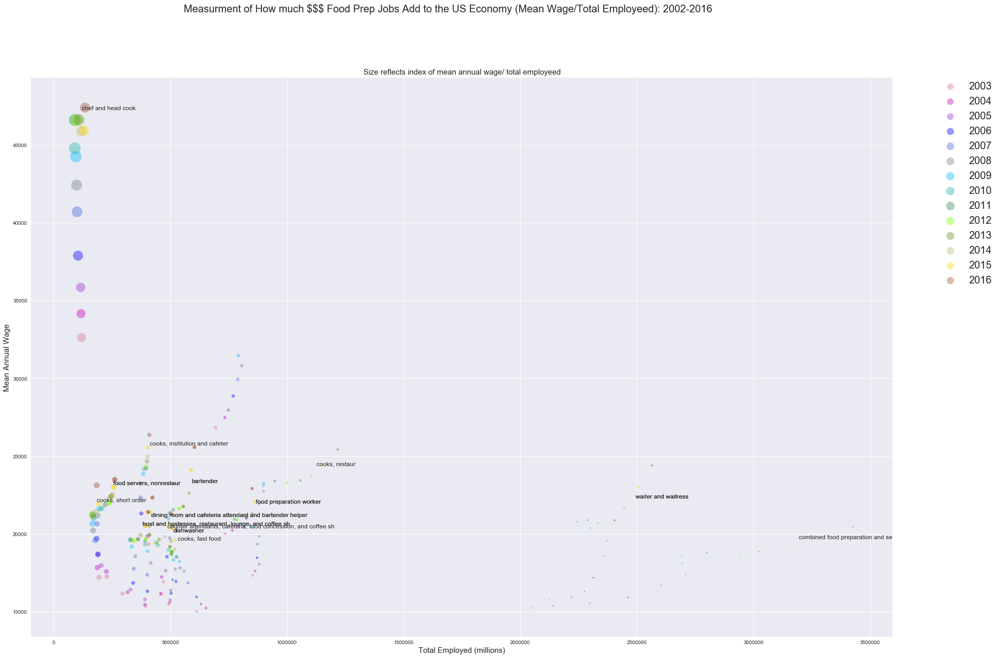

In [40]:
fig, ax= plt.subplots()

large_plot(df_food_prep_serv)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 18
fig_size[1] = 18
plt.xlabel('Total Employed (millions)', fontsize=15)
plt.ylabel('Mean Annual Wage', fontsize=15)
plt.suptitle('Measurment of How much $$$ Food Prep Jobs Add to the US Economy (Mean Wage/Total Employeed): 2002-2016', fontsize=20)
plt.title('Size reflects index of mean annual wage/ total employeed', fontsize= 15)
plt.legend( ('2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016')
           , fontsize= 20, markerscale=1, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

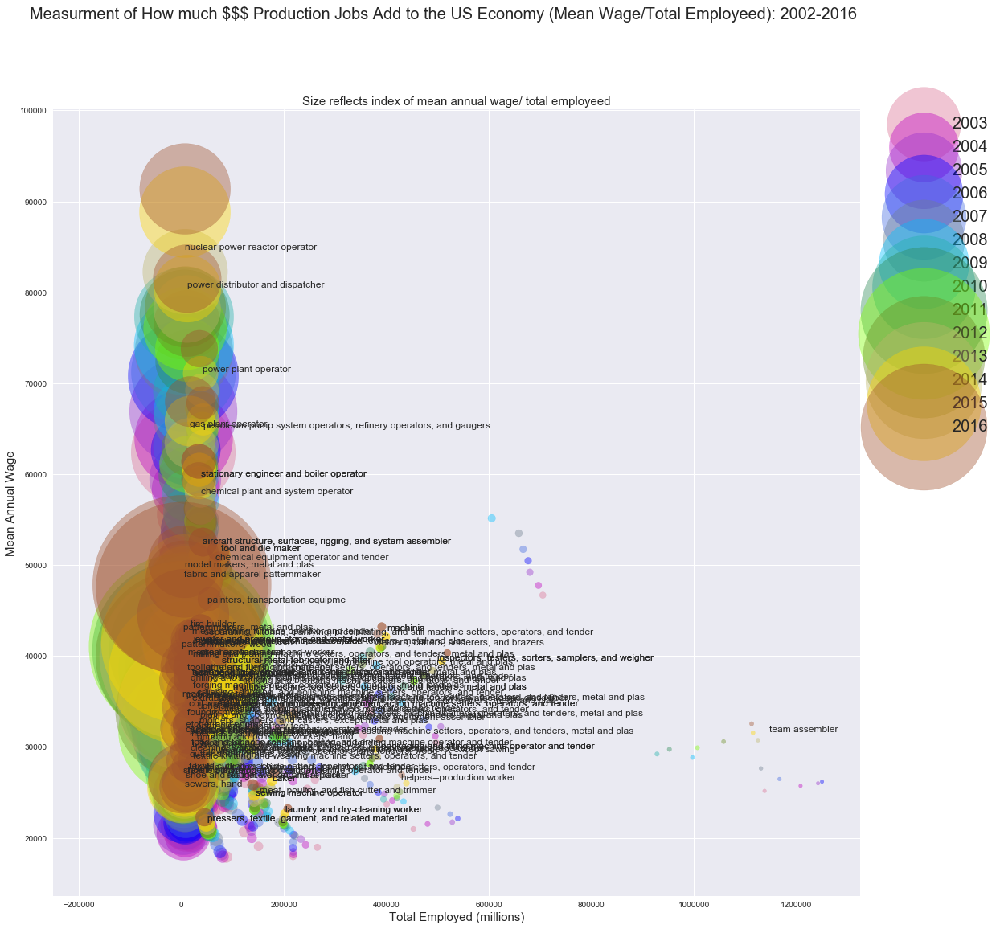

In [41]:
fig, ax= plt.subplots()

large_plot(df_production)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 18
fig_size[1] = 18
plt.xlabel('Total Employed (millions)', fontsize=15)
plt.ylabel('Mean Annual Wage', fontsize=15)
plt.suptitle('Measurment of How much $$$ Production Jobs Add to the US Economy (Mean Wage/Total Employeed): 2002-2016', fontsize=20)
plt.title('Size reflects index of mean annual wage/ total employeed', fontsize= 15)
plt.legend( ('2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016')
           , fontsize= 20, markerscale=1, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

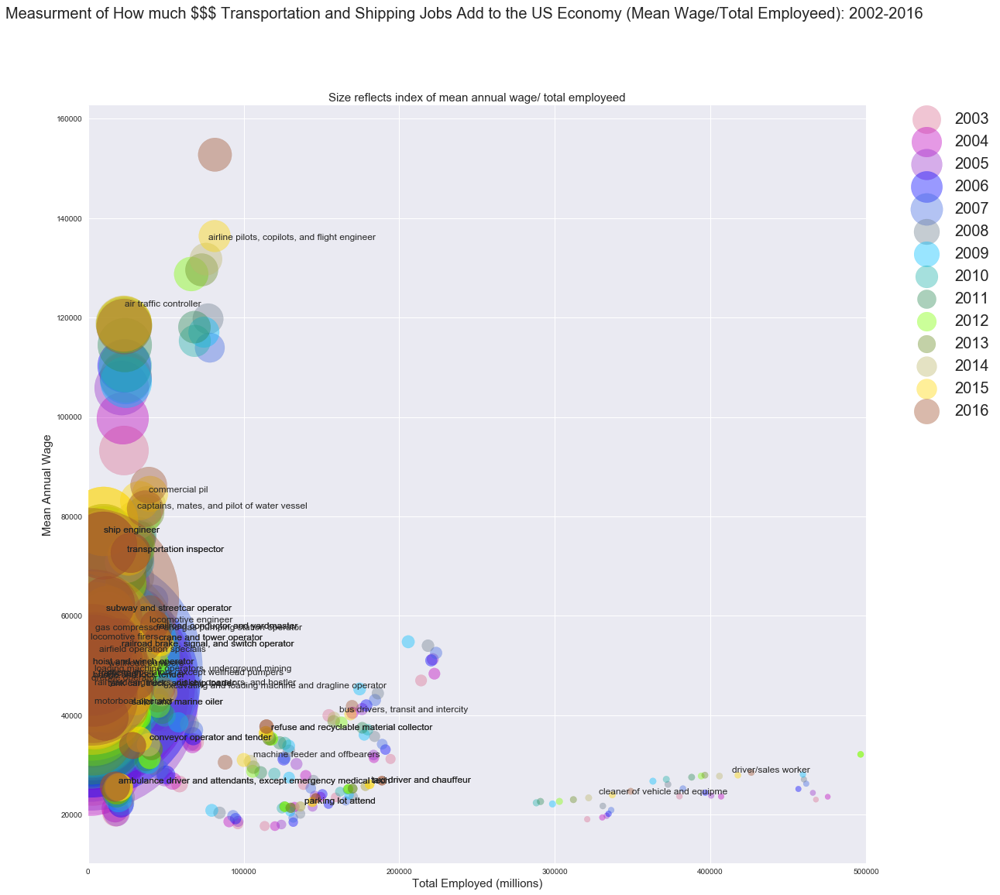

In [42]:
fig, ax= plt.subplots()

large_plot(df_trans_material_moving)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 18
fig_size[1] = 18
plt.xlabel('Total Employed (millions)', fontsize=15)
plt.ylabel('Mean Annual Wage', fontsize=15)
plt.suptitle('Measurment of How much $$$ Transportation and Shipping Jobs Add to the US Economy (Mean Wage/Total Employeed): 2002-2016', fontsize=20)
plt.title('Size reflects index of mean annual wage/ total employeed', fontsize= 15)
plt.legend( ('2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016')
           , fontsize= 20, markerscale=0.2, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xlim(xmin=-100, xmax=500000)
plt.show()

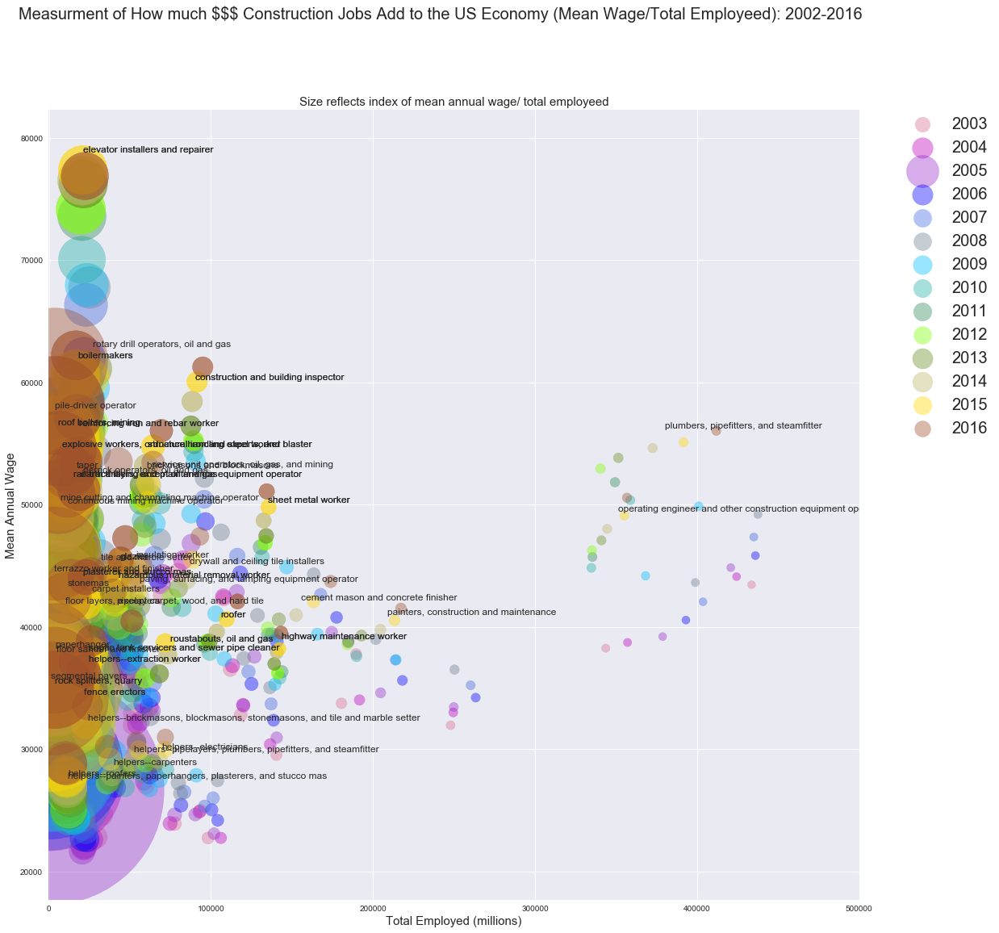

In [43]:
fig, ax= plt.subplots()

large_plot(df_construct)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 18
fig_size[1] = 18
plt.xlabel('Total Employed (millions)', fontsize=15)
plt.ylabel('Mean Annual Wage', fontsize=15)
plt.suptitle('Measurment of How much $$$ Construction Jobs Add to the US Economy (Mean Wage/Total Employeed): 2002-2016', fontsize=20)
plt.title('Size reflects index of mean annual wage/ total employeed', fontsize= 15)
plt.legend( ('2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016')
           , fontsize= 20, markerscale=0.2, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xlim(xmin=-100, xmax=500000)
plt.show()

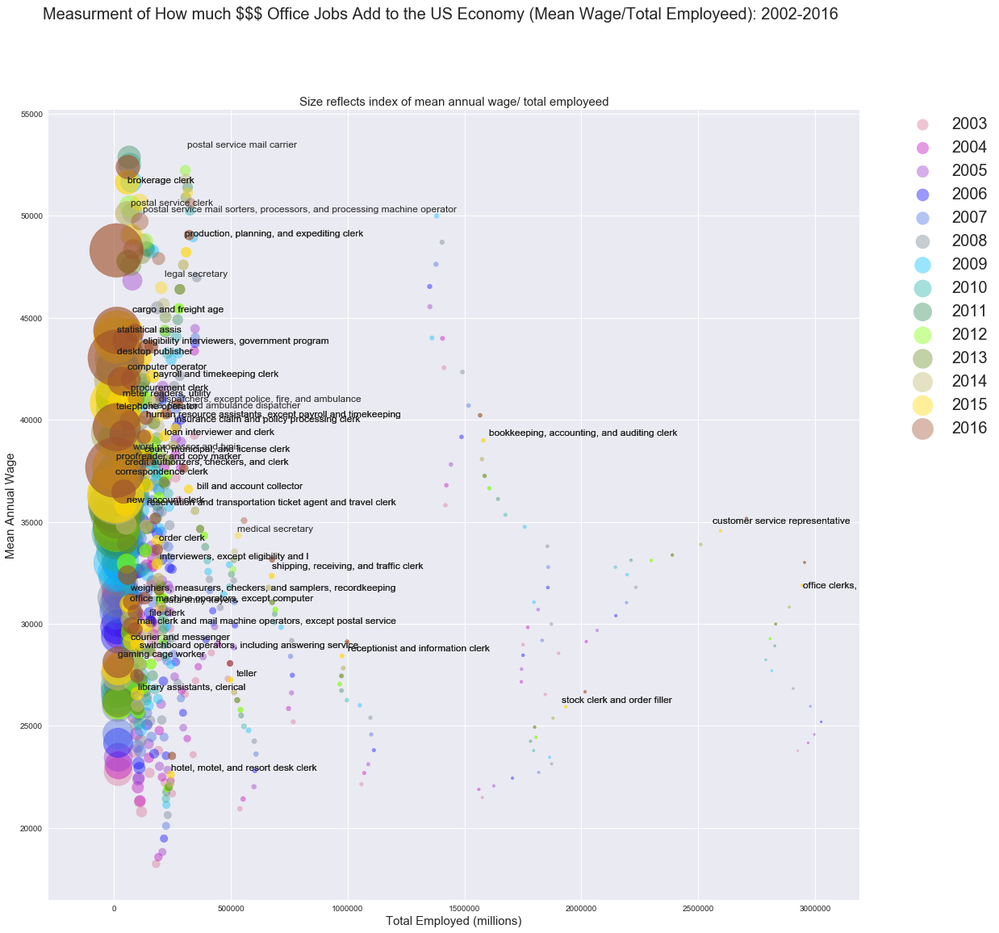

In [44]:
fig, ax= plt.subplots()

large_plot(df_off_admin)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 18
fig_size[1] = 18
plt.xlabel('Total Employed (millions)', fontsize=15)
plt.ylabel('Mean Annual Wage', fontsize=15)
plt.suptitle('Measurment of How much $$$ Office Jobs Add to the US Economy (Mean Wage/Total Employeed): 2002-2016', fontsize=20)
plt.title('Size reflects index of mean annual wage/ total employeed', fontsize= 15)
plt.legend( ('2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016')
           , fontsize= 20, markerscale=0.5, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.show()

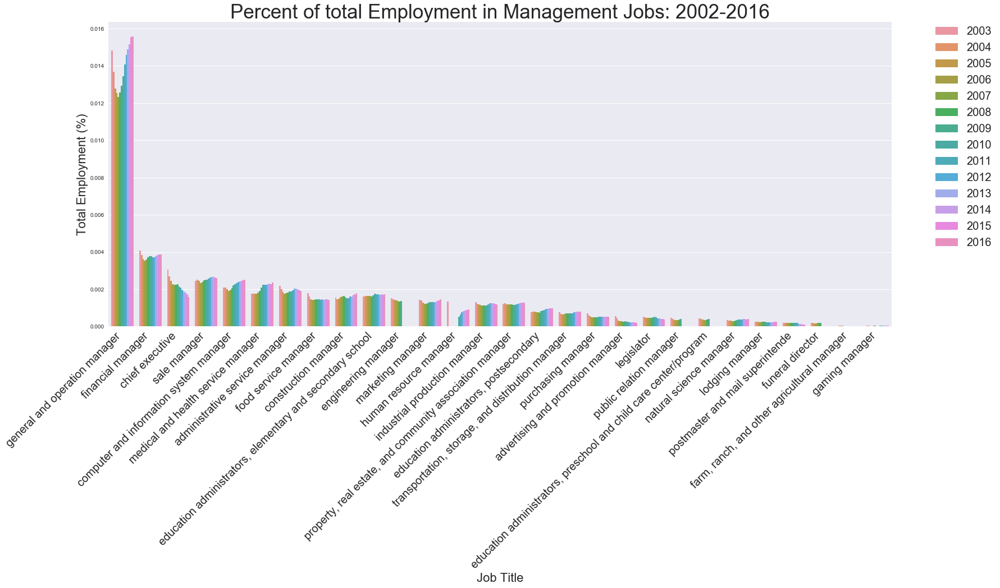

In [249]:
df_manag= df_manag.sort_values('job_employ_percent', ascending=False)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 25
fig_size[1] = 10


g= sns.barplot(x= 'Occupation_title', y= 'job_employ_percent', hue='Year' ,data=df_manag)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize= 20)
plt.xticks( rotation=45, fontsize=20, ha='right')
plt.ylabel('Total Employment (%)', fontsize= 22)
plt.title('Percent of total Employment in Management Jobs: 2002-2016', fontsize=35)
plt.xlabel('Job Title', fontsize= 22)
plt.show()

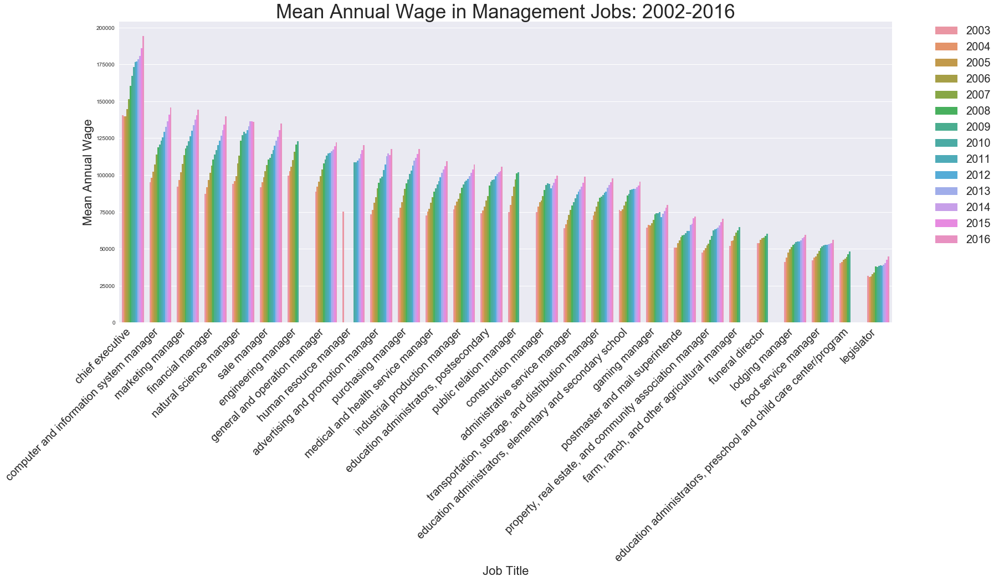

In [250]:
df_manag= df_manag.sort_values('mean_annual_wage', ascending=False)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 25
fig_size[1] = 10


g= sns.barplot(x= 'Occupation_title', y= 'mean_annual_wage', hue='Year' ,data=df_manag)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize= 20)
plt.xticks( rotation=45, fontsize=20, ha='right')
plt.ylabel('Mean Annual Wage', fontsize= 22)
plt.title('Mean Annual Wage in Management Jobs: 2002-2016', fontsize=35)
plt.xlabel('Job Title', fontsize= 22)
plt.show()

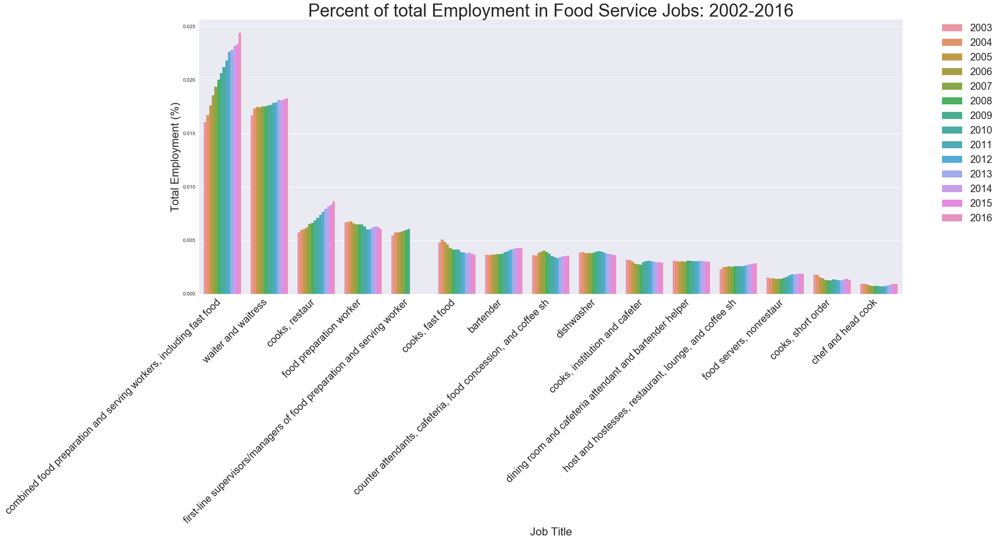

In [265]:
df_food_prep_serv= df_food_prep_serv.sort_values('job_employ_percent', ascending=False)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 25
fig_size[1] = 10


g= sns.barplot(x= 'Occupation_title', y= 'job_employ_percent', hue='Year' ,data=df_food_prep_serv)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize= 20)
plt.xticks( rotation=45, fontsize=20, ha='right')
plt.ylabel('Total Employment (%)', fontsize= 22)
plt.title('Percent of total Employment in Food Service Jobs: 2002-2016', fontsize=35)
plt.xlabel('Job Title', fontsize= 22)
plt.show()

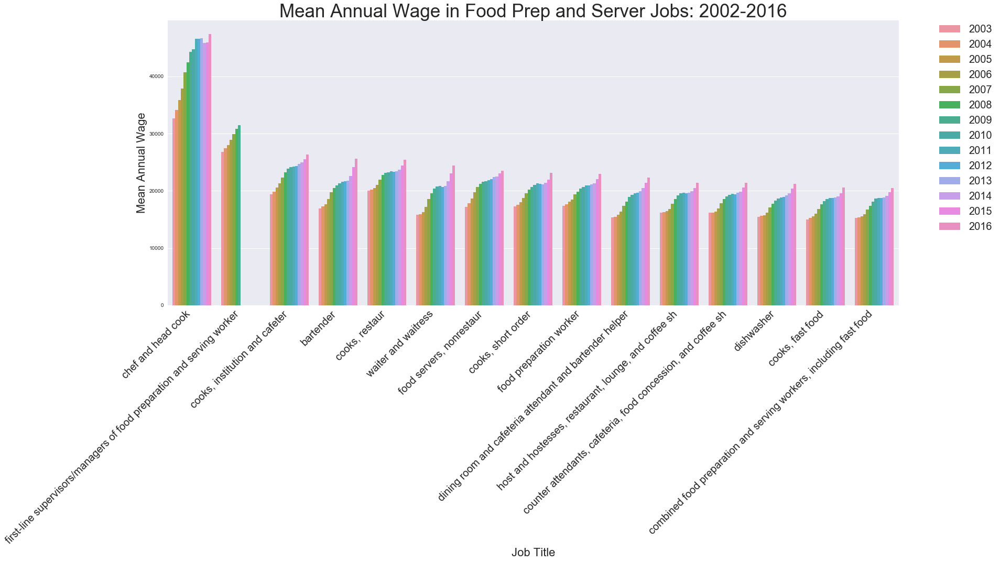

In [266]:
df_food_prep_serv=df_food_prep_serv.sort_values('mean_annual_wage', ascending=False)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 25
fig_size[1] = 10


g= sns.barplot(x= 'Occupation_title', y= 'mean_annual_wage', hue='Year' ,data=df_food_prep_serv)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize= 20)
plt.xticks( rotation=45, fontsize=20, ha='right')
plt.ylabel('Mean Annual Wage', fontsize= 22)
plt.title('Mean Annual Wage in Food Prep and Server Jobs: 2002-2016', fontsize=35)
plt.xlabel('Job Title', fontsize= 22)
plt.show()

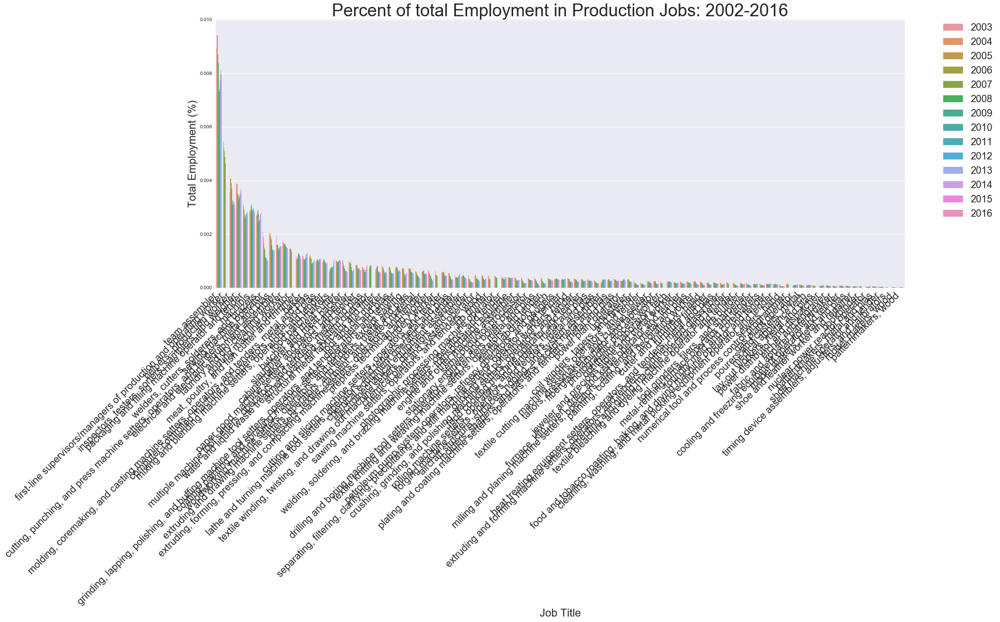

In [267]:
df_production= df_production.sort_values('job_employ_percent', ascending=False)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 25
fig_size[1] = 10


g= sns.barplot(x= 'Occupation_title', y= 'job_employ_percent', hue='Year' ,data=df_production)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize= 20)
plt.xticks( rotation=45, fontsize=20, ha='right')
plt.ylabel('Total Employment (%)', fontsize= 22)
plt.title('Percent of total Employment in Production Jobs: 2002-2016', fontsize=35)
plt.xlabel('Job Title', fontsize= 22)
plt.show()

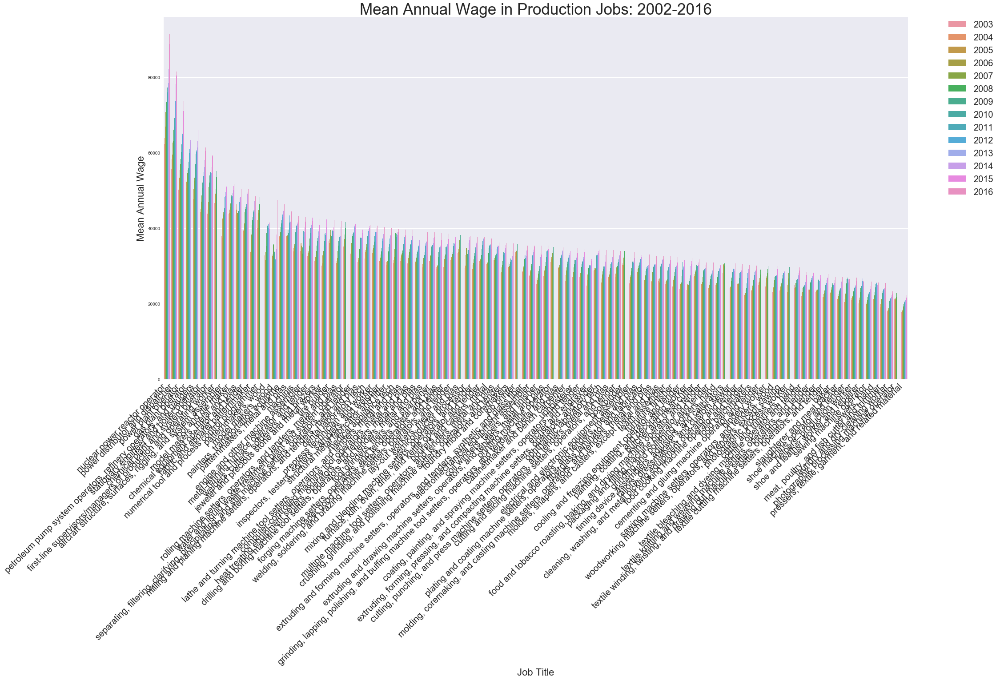

In [269]:
df_production=df_production.sort_values('mean_annual_wage', ascending=False)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 30
fig_size[1] = 15


g= sns.barplot(x= 'Occupation_title', y= 'mean_annual_wage', hue='Year' ,data=df_production)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize= 20)
plt.xticks( rotation=45, fontsize=20, ha='right')
plt.ylabel('Mean Annual Wage', fontsize= 22)
plt.title('Mean Annual Wage in Production Jobs: 2002-2016', fontsize=35)
plt.xlabel('Job Title', fontsize= 22)
plt.show()

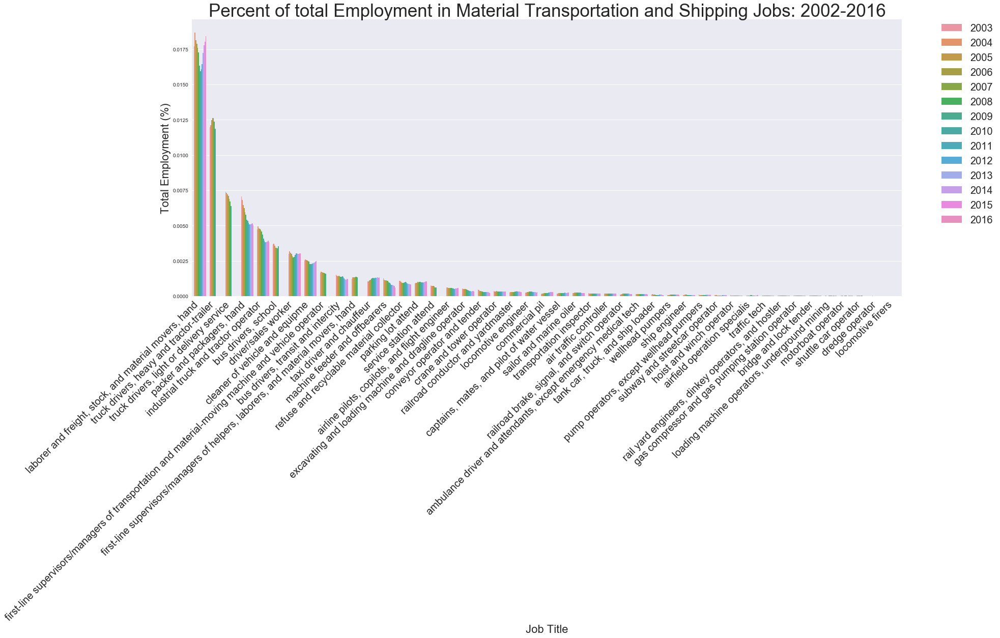

In [288]:
df_trans_material_moving= df_trans_material_moving.sort_values('job_employ_percent', ascending=False)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 25
fig_size[1] = 10


g= sns.barplot(x= 'Occupation_title', y= 'job_employ_percent', hue='Year' ,data=df_trans_material_moving)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize= 20)
plt.xticks( rotation=45, fontsize=20, ha='right')
plt.ylabel('Total Employment (%)', fontsize= 22)
plt.title('Percent of total Employment in Material Transportation and Shipping Jobs: 2002-2016', fontsize=35)
plt.xlabel('Job Title', fontsize= 22)
plt.show()

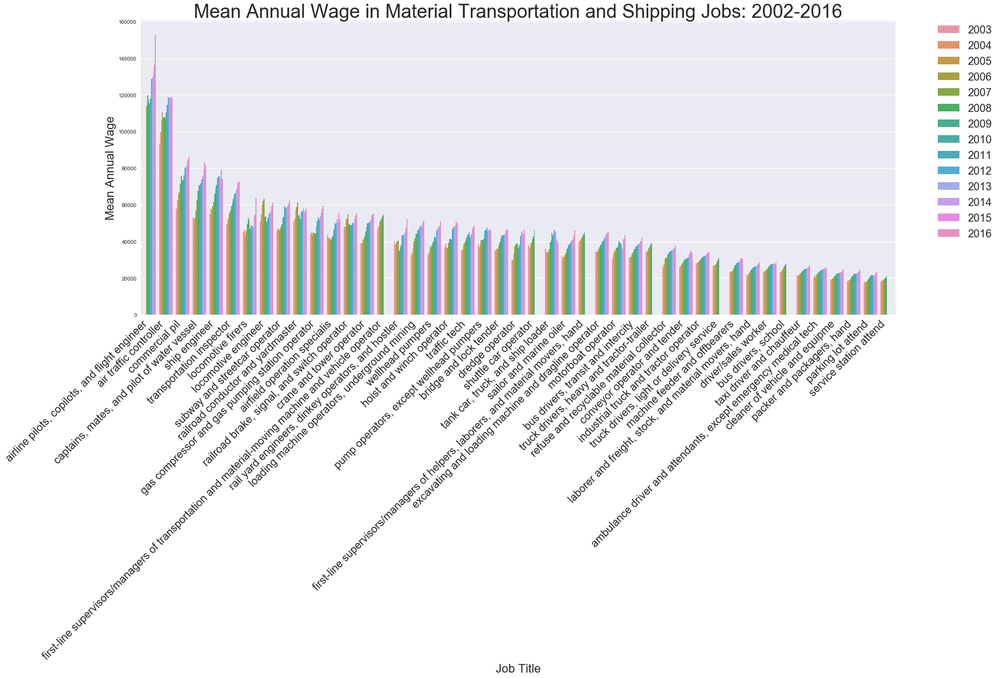

In [287]:
df_trans_material_moving=df_trans_material_moving.sort_values('mean_annual_wage', ascending=False)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 25
fig_size[1] = 10


g= sns.barplot(x= 'Occupation_title', y= 'mean_annual_wage', hue='Year' ,data=df_trans_material_moving)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize= 20)
plt.xticks( rotation=45, fontsize=20, ha='right')
plt.ylabel('Mean Annual Wage', fontsize= 22)
plt.title('Mean Annual Wage in Material Transportation and Shipping Jobs: 2002-2016', fontsize=35)
plt.xlabel('Job Title', fontsize= 22)
plt.show()

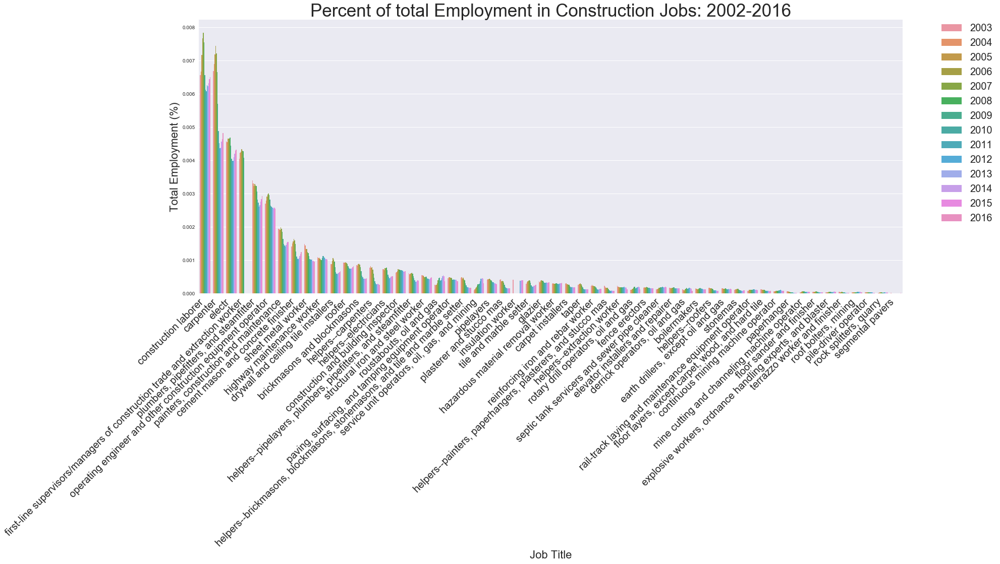

In [290]:
df_construct= df_construct.sort_values('job_employ_percent', ascending=False)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 25
fig_size[1] = 10


g= sns.barplot(x= 'Occupation_title', y= 'job_employ_percent', hue='Year' ,data=df_construct)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize= 20)
plt.xticks( rotation=45, fontsize=20, ha='right')
plt.ylabel('Total Employment (%)', fontsize= 22)
plt.title('Percent of total Employment in Construction Jobs: 2002-2016', fontsize=35)
plt.xlabel('Job Title', fontsize= 22)
plt.show()

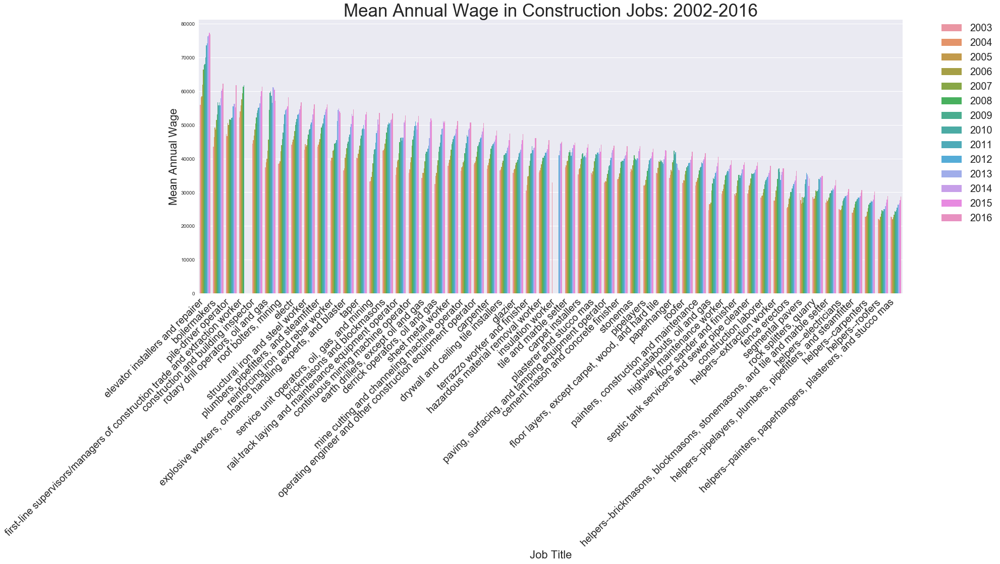

In [289]:
df_construct=df_construct.sort_values('mean_annual_wage', ascending=False)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 25
fig_size[1] = 10


g= sns.barplot(x= 'Occupation_title', y= 'mean_annual_wage', hue='Year' ,data=df_construct)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize= 20)
plt.xticks( rotation=45, fontsize=20, ha='right')
plt.ylabel('Mean Annual Wage', fontsize= 22)
plt.title('Mean Annual Wage in Construction Jobs: 2002-2016', fontsize=35)
plt.xlabel('Job Title', fontsize= 22)
plt.show()

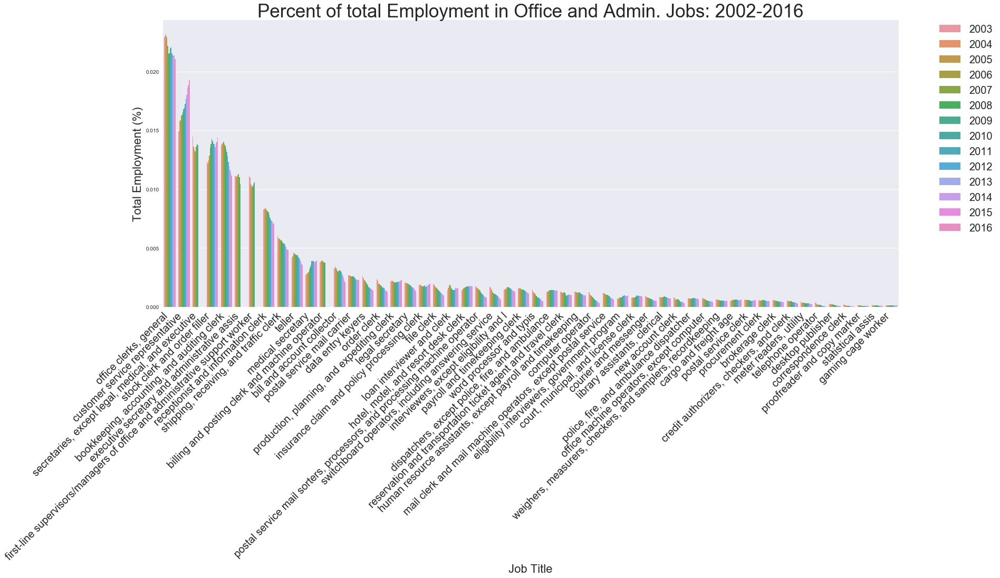

In [291]:
df_off_admin= df_off_admin.sort_values('job_employ_percent', ascending=False)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 25
fig_size[1] = 10


g= sns.barplot(x= 'Occupation_title', y= 'job_employ_percent', hue='Year' ,data=df_off_admin)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize= 20)
plt.xticks( rotation=45, fontsize=20, ha='right')
plt.ylabel('Total Employment (%)', fontsize= 22)
plt.title('Percent of total Employment in Office and Admin. Jobs: 2002-2016', fontsize=35)
plt.xlabel('Job Title', fontsize= 22)
plt.show()

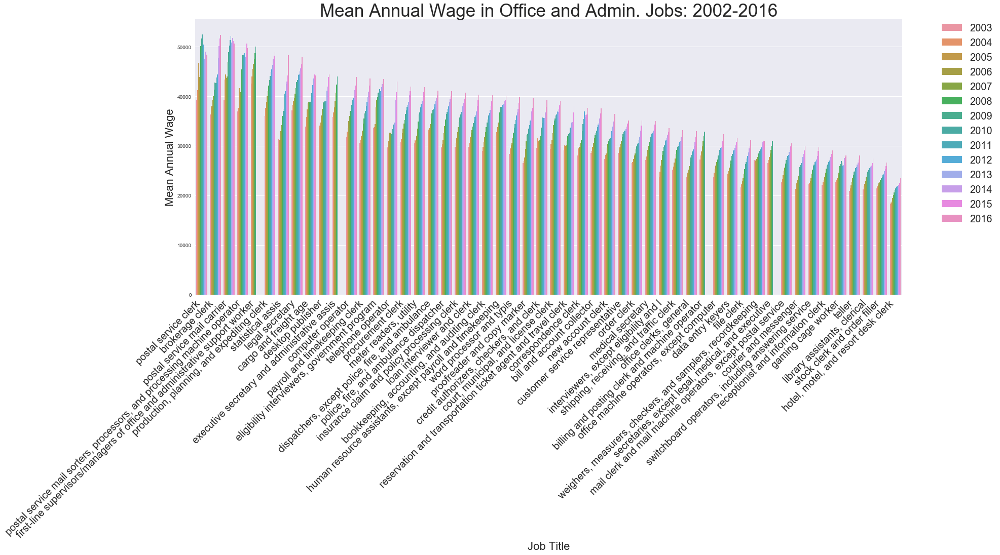

In [292]:
df_off_admin=df_off_admin.sort_values('mean_annual_wage', ascending=False)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 25
fig_size[1] = 10


g= sns.barplot(x= 'Occupation_title', y= 'mean_annual_wage', hue='Year' ,data=df_off_admin)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize= 20)
plt.xticks( rotation=45, fontsize=20, ha='right')
plt.ylabel('Mean Annual Wage', fontsize= 22)
plt.title('Mean Annual Wage in Office and Admin. Jobs: 2002-2016', fontsize=35)
plt.xlabel('Job Title', fontsize= 22)
plt.show()

In [195]:
 df_manag['mean_employment']=   df_manag.mean_annual_wage/  df_manag.total_employment

df_manag_b= df_manag.loc[df_manag['OCC_group']== 'broad']
df_manag_d= df_manag.loc[df_manag['OCC_group']== 'detailed']

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


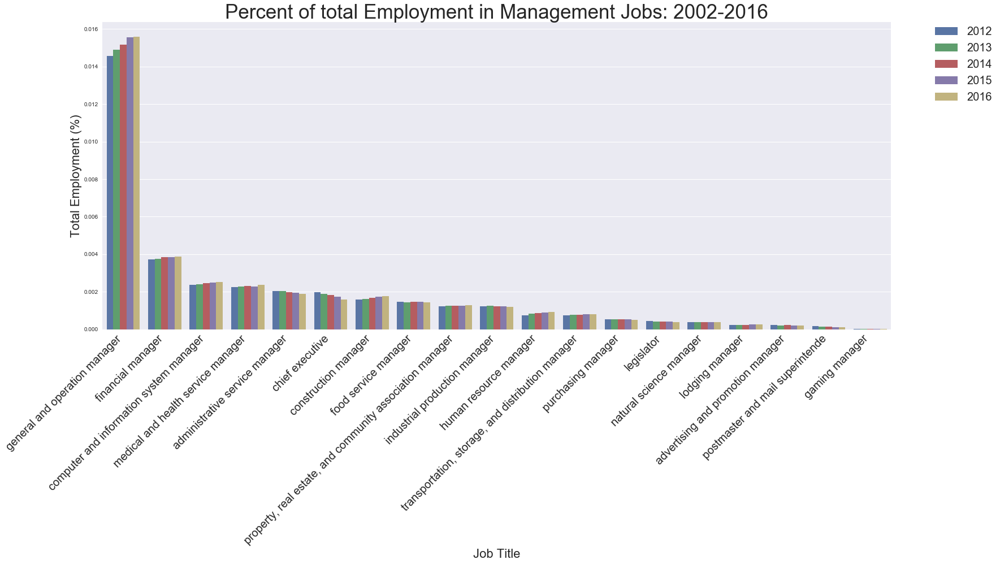

In [129]:
df_manag_b= df_manag_b.sort_values('job_employ_percent', ascending=False)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 25
fig_size[1] = 10


g= sns.barplot(x= 'Occupation_title', y= 'job_employ_percent', hue='Year' ,data=df_manag_b)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize= 20)
plt.xticks( rotation=45, fontsize=20, ha='right')
plt.ylabel('Total Employment (%)', fontsize= 22)
plt.title('Percent of total Employment in Management Jobs: 2002-2016', fontsize=35)
plt.xlabel('Job Title', fontsize= 22)
plt.show()

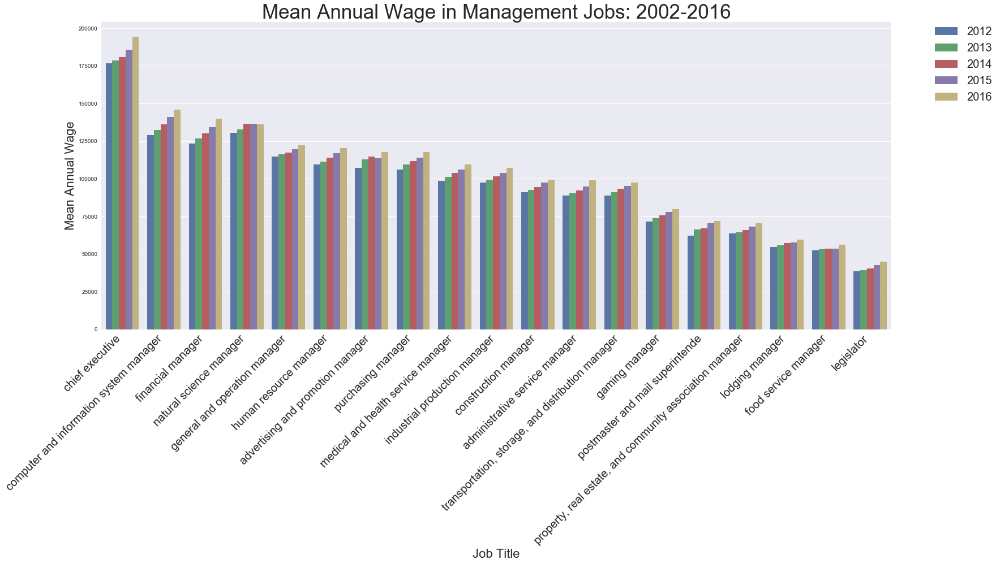

In [130]:
df_manag_b= df_manag_b.sort_values('mean_annual_wage', ascending=False)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 25
fig_size[1] = 10


g= sns.barplot(x= 'Occupation_title', y= 'mean_annual_wage', hue='Year' ,data=df_manag_b)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize= 20)
plt.xticks( rotation=45, fontsize=20, ha='right')
plt.ylabel('Mean Annual Wage', fontsize= 22)
plt.title('Mean Annual Wage in Management Jobs: 2002-2016', fontsize=35)
plt.xlabel('Job Title', fontsize= 22)
plt.show()

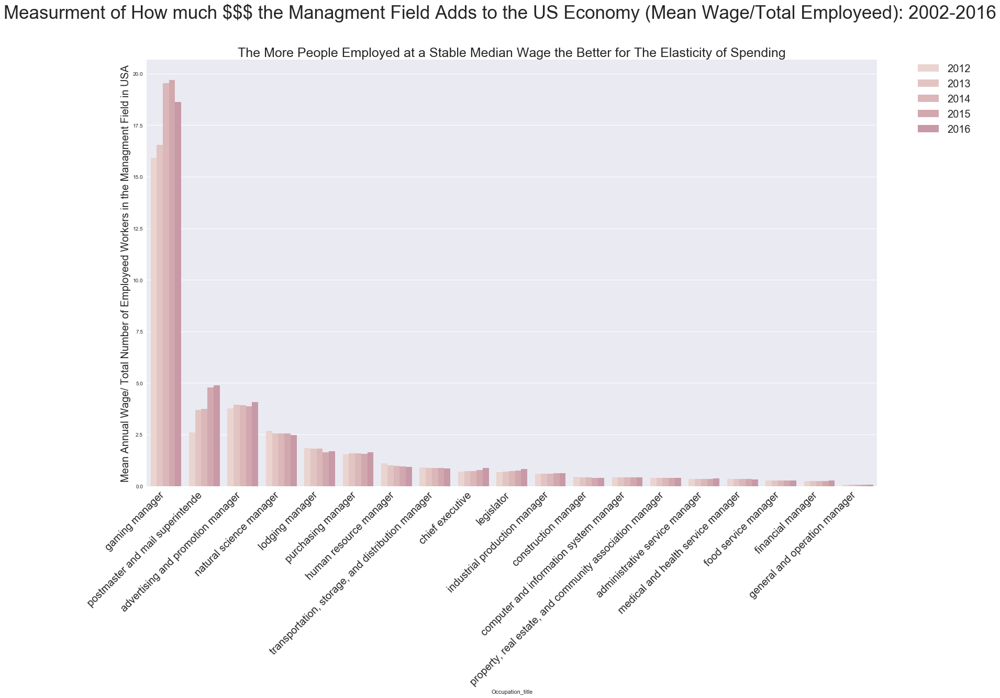

In [131]:
df_manag_b= df_manag_b.sort_values('mean_employment', ascending=False)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 25
fig_size[1] = 15


g= sns.barplot(x= 'Occupation_title', y= 'mean_employment', hue='Year' ,data=df_manag_b,
               palette= sns.cubehelix_palette(15))
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize= 20)
plt.xticks( rotation=45, fontsize=20, ha='right')
plt.ylabel('Mean Annual Wage/ Total Number of Employeed Workers in the Managment Field in USA', fontsize=20)
plt.suptitle('Measurment of How much $$$ the Managment Field Adds to the US Economy (Mean Wage/Total Employeed): 2002-2016', fontsize=35)
plt.title('The More People Employed at a Stable Median Wage the Better for The Elasticity of Spending', fontsize= 25)

plt.show()

In [144]:
df_off_admin_b= df_off_admin.loc[df_off_admin['OCC_group']== 'broad']
df_off_admin_d= df_off_admin.loc[df_off_admin['OCC_group']== 'detailed']

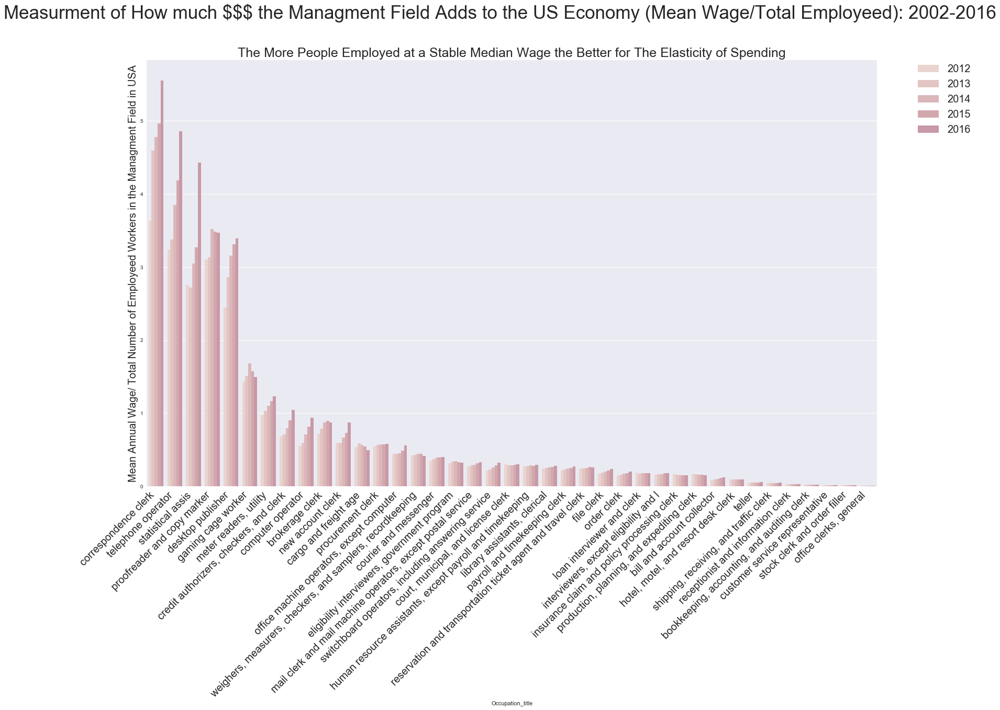

In [126]:
df_off_admin_b= df_off_admin_b.sort_values('mean_employment', ascending=False)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 25
fig_size[1] = 15


g= sns.barplot(x= 'Occupation_title', y= 'mean_employment', hue='Year' ,data=df_off_admin_b,
               palette= sns.cubehelix_palette(15))
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize= 20)
plt.xticks( rotation=45, fontsize=20, ha='right')
plt.ylabel('Mean Annual Wage/ Total Number of Employeed Workers in the Managment Field in USA', fontsize=20)
plt.suptitle('Measurment of How much $$$ the Managment Field Adds to the US Economy (Mean Wage/Total Employeed): 2002-2016', fontsize=35)
plt.title('The More People Employed at a Stable Median Wage the Better for The Elasticity of Spending', fontsize= 25)

plt.show()

# Deep-Deep Dive: Construction is responsive to the Economy 

# Management and Food Are Changing

In [181]:
 df_construct['mean_employment']=  df_construct.mean_annual_wage/ df_construct.total_employment

df_cons_b= df_construct.loc[df_construct['OCC_group']== 'broad']
df_cons_d= df_construct.loc[df_construct['OCC_group']== 'detailed']

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


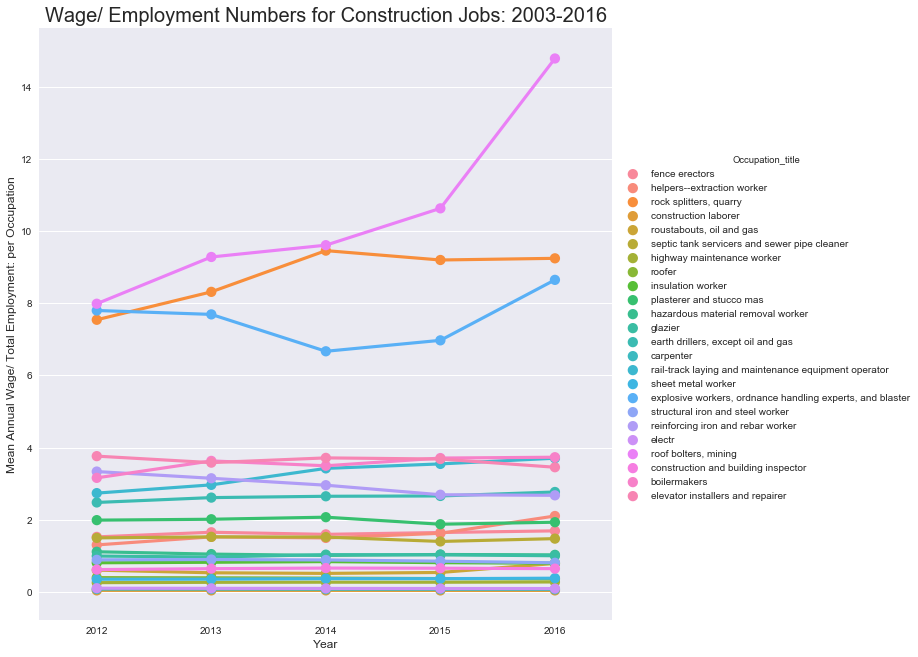

In [225]:
sns.factorplot(x='Year', y= 'mean_employment', hue='Occupation_title',size=9 , aspect=1,
               data=df_cons_b, alpha=0.5, linewidth=5.0)

plt.xlabel('Year', fontsize=12)
plt.ylabel('Mean Annual Wage/ Total Employment: per Occupation', fontsize= 12)
plt.title('Wage/ Employment Numbers for Construction Jobs: 2003-2016', fontsize= 20)

plt.show()

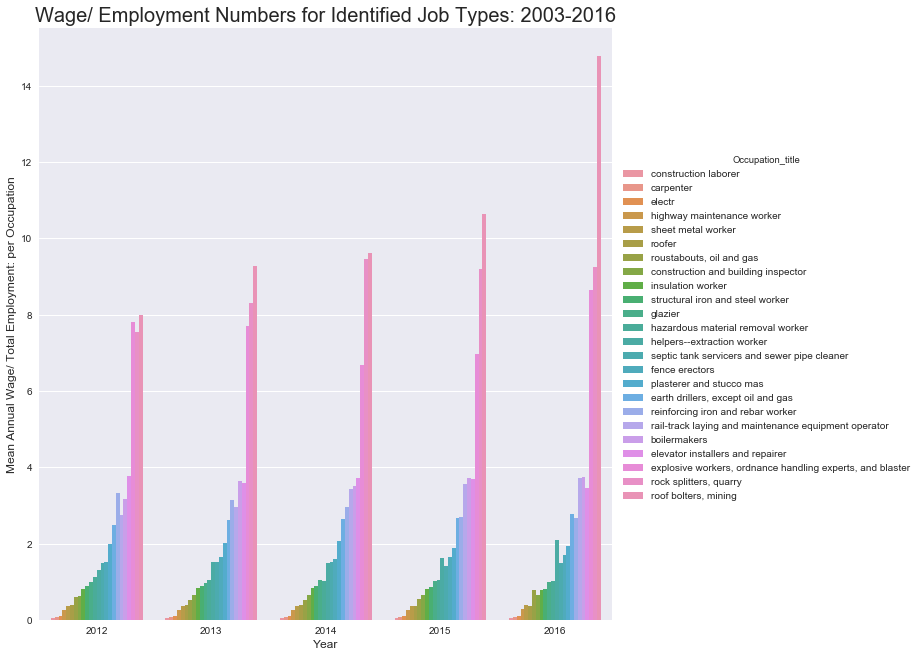

In [192]:
df_cons_b= df_cons_b.sort_values('mean_employment')

sns.factorplot(x='Year', y= 'mean_employment', hue='Occupation_title',size=9 , aspect=1,
               data=df_cons_b, kind='bar')

plt.xlabel('Year', fontsize=12)
plt.ylabel('Mean Annual Wage/ Total Employment: per Occupation', fontsize= 12)
plt.title('Wage/ Employment Numbers for Identified Job Types: 2003-2016', fontsize= 20)

plt.show()

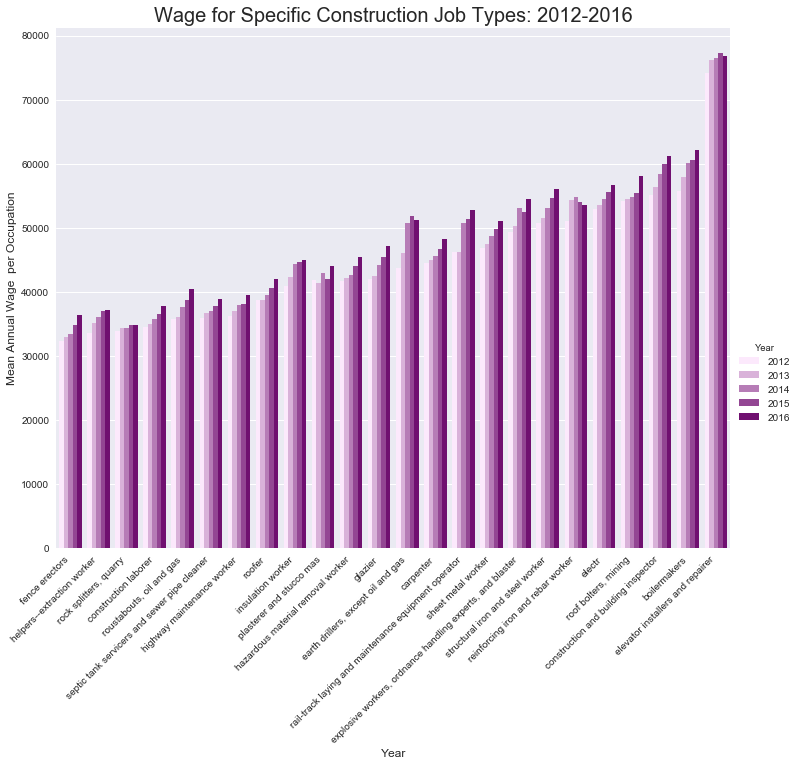

In [221]:
df_cons_b= df_cons_b.sort_values('mean_annual_wage')

sns.factorplot(x='Occupation_title', y= 'mean_annual_wage', hue='Year',size=8 , aspect=1.3,
               data=df_cons_b, kind= 'bar', color= 'purple')

plt.xlabel('Year', fontsize=12)
plt.ylabel('Mean Annual Wage  per Occupation', fontsize= 12)
plt.title('Wage for Specific Construction Job Types: 2012-2016', fontsize= 20)
plt.xticks(rotation=45, ha='right')

plt.show()

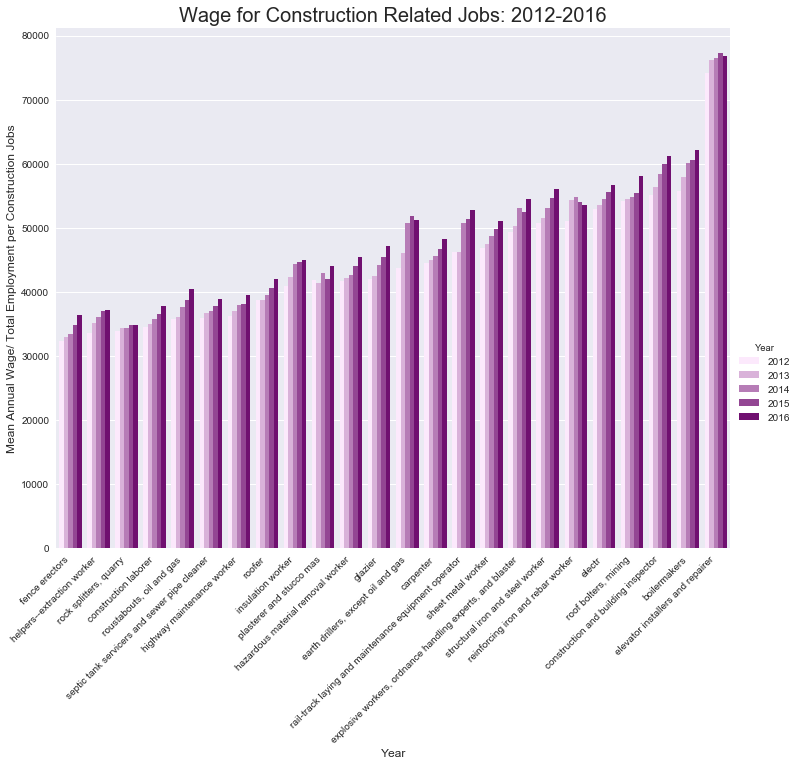

In [224]:
df_cons_b= df_cons_b.sort_values('mean_annual_wage')

sns.factorplot(x='Occupation_title', y= 'mean_annual_wage', hue='Year',size=8 , aspect=1.3,
               data=df_cons_b, kind= 'bar', color= 'purple')

plt.xlabel('Year', fontsize=12)
plt.ylabel('Mean Annual Wage/ Total Employment per Construction Jobs', fontsize= 12)
plt.title('Wage for Construction Related Jobs: 2012-2016', fontsize= 20)
plt.xticks(rotation=45, ha='right')

plt.show()

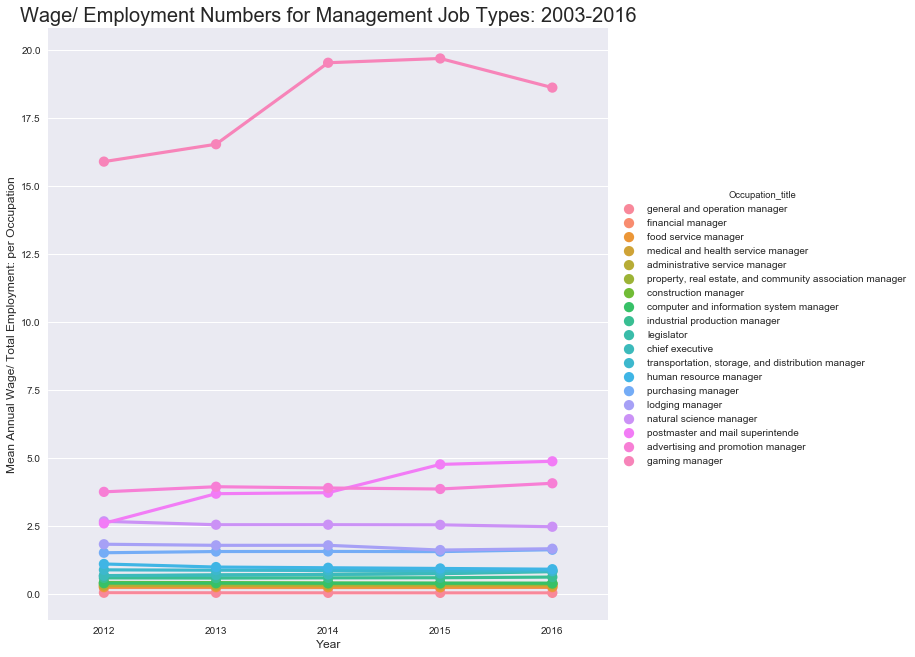

In [207]:
sns.factorplot(x='Year', y= 'mean_employment', hue='Occupation_title',size=9 , aspect=1,
               data=df_manag_b, alpha=0.5, linewidth=5.0)

plt.xlabel('Year', fontsize=12)
plt.ylabel('Mean Annual Wage/ Total Employment: per Occupation', fontsize= 12)
plt.title('Wage/ Employment Numbers for Management Job Types: 2003-2016', fontsize= 20)

plt.show()

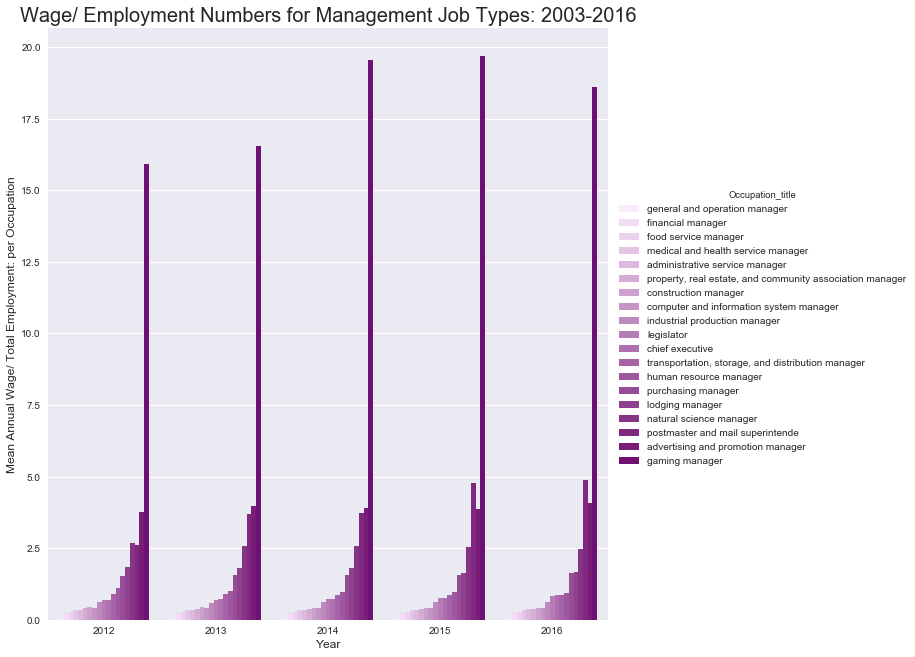

In [198]:
df_manag_b= df_manag_b.sort_values('mean_employment')
sns.factorplot(x='Year', y= 'mean_employment', hue='Occupation_title',size=9 , aspect=1,
               data=df_manag_b, kind='bar', color= 'purple')

plt.xlabel('Year', fontsize=12)
plt.ylabel('Mean Annual Wage/ Total Employment: per Occupation', fontsize= 12)
plt.title('Wage/ Employment Numbers for Management Job Types: 2003-2016', fontsize= 20)

plt.show()

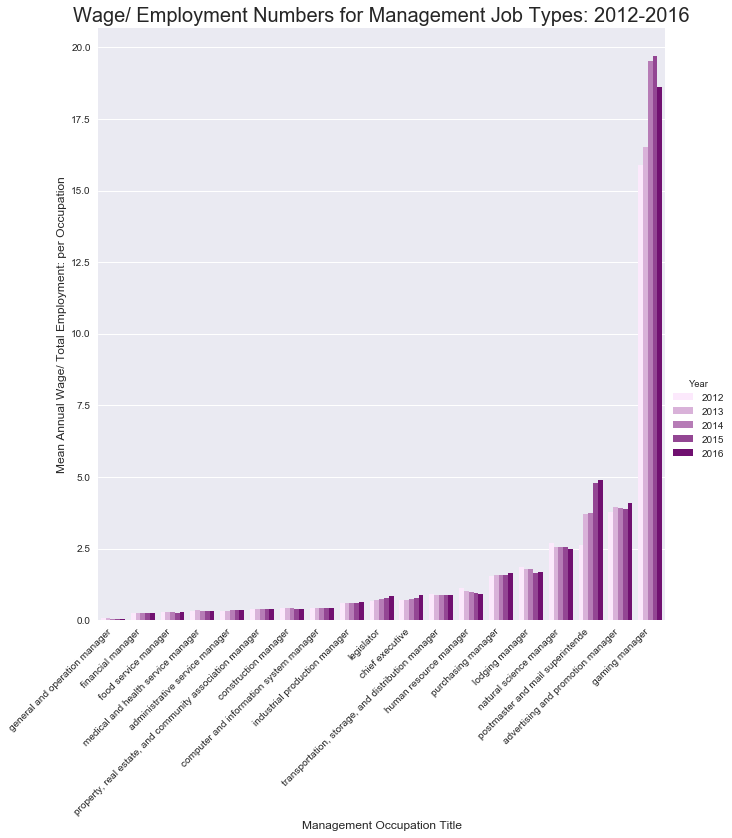

In [223]:
df_manag_b= df_manag_b.sort_values('mean_employment')
sns.factorplot(hue='Year', y= 'mean_employment', x='Occupation_title',size=9 , aspect=1,
               data=df_manag_b, kind='bar', color= 'purple')

plt.xlabel('Management Occupation Title', fontsize=12)
plt.ylabel('Mean Annual Wage/ Total Employment: per Occupation', fontsize= 12)
plt.title('Wage/ Employment Numbers for Management Job Types: 2012-2016', fontsize= 20)
plt.xticks(rotation= 45, ha='right')

plt.show()

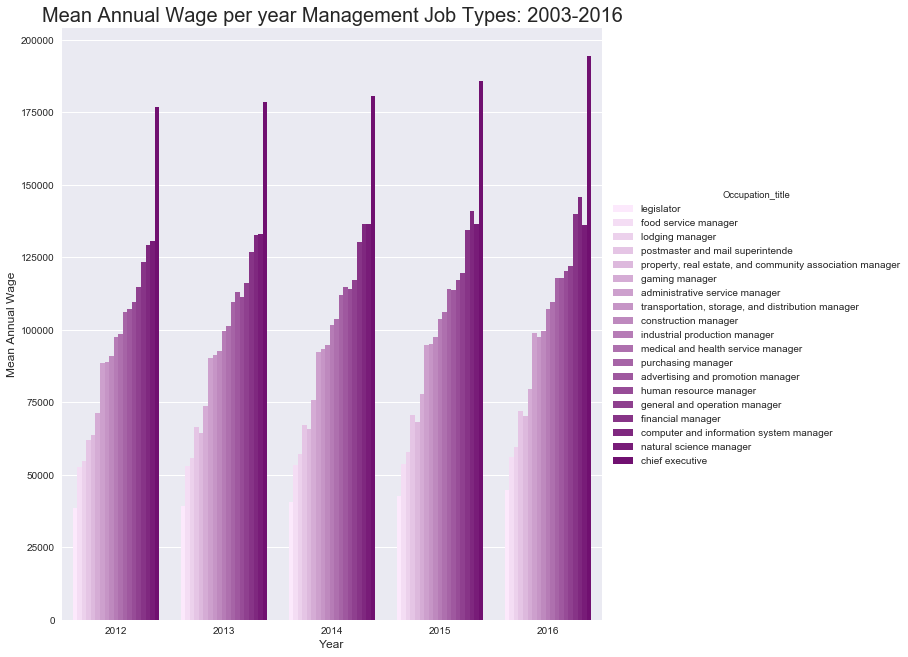

In [208]:
df_manag_b= df_manag_b.sort_values('mean_annual_wage')
sns.factorplot(x='Year', y= 'mean_annual_wage', hue='Occupation_title',size=9 , aspect=1,
               data=df_manag_b, kind='bar', color= 'purple')

plt.xlabel('Year', fontsize=12)
plt.ylabel('Mean Annual Wage', fontsize= 12)
plt.title('Mean Annual Wage per year Management Job Types: 2003-2016', fontsize= 20)

plt.show()

In [212]:

df_food_prep_serv['mean_employment']=  df_food_prep_serv.mean_annual_wage/ df_food_prep_serv.total_employment

df_food_b= df_food_prep_serv.loc[df_food_prep_serv['OCC_group']== 'broad']
df_food_d= df_food_prep_serv.loc[df_food_prep_serv['OCC_group']== 'detailed']

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


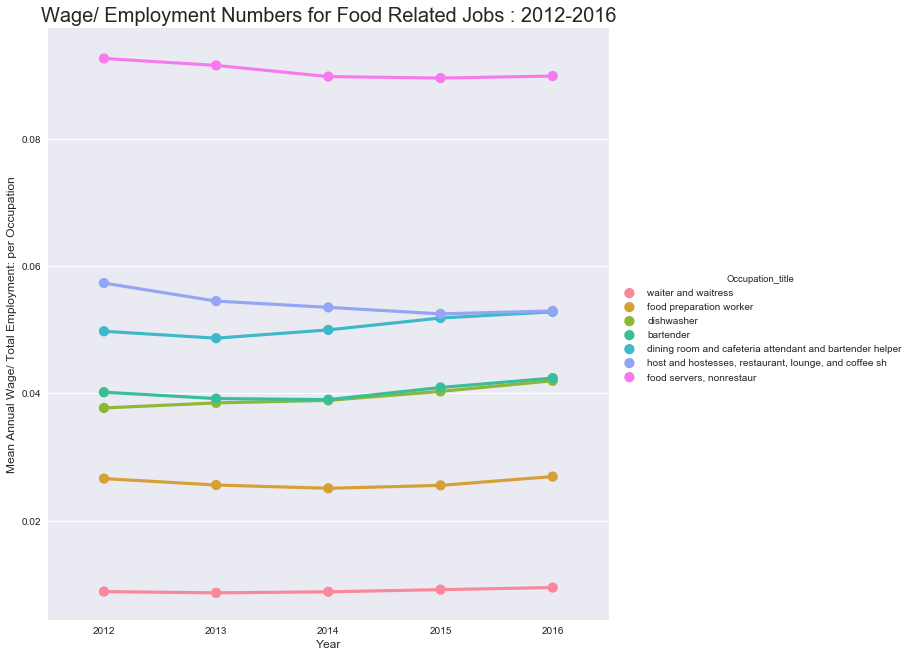

In [222]:
sns.factorplot(x='Year', y= 'mean_employment', hue='Occupation_title',size=9 , aspect=1,
               data=df_food_b, alpha=0.5, linewidth=5.0)

plt.xlabel('Year', fontsize=12)
plt.ylabel('Mean Annual Wage/ Total Employment: per Occupation', fontsize= 12)
plt.title('Wage/ Employment Numbers for Food Related Jobs : 2012-2016', fontsize= 20)

plt.show()

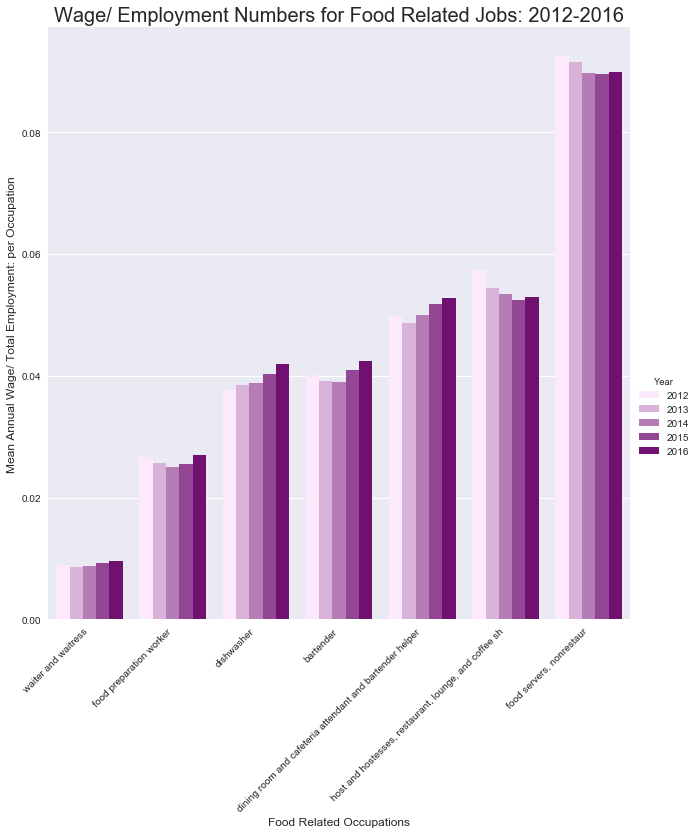

In [218]:
df_food_b= df_food_b.sort_values('mean_employment')
sns.factorplot(hue='Year', y= 'mean_employment', x='Occupation_title',size=9 , aspect=1,
               data=df_food_b, kind='bar', color= 'purple')

plt.xlabel('Food Related Occupations', fontsize=12)
plt.ylabel('Mean Annual Wage/ Total Employment: per Occupation', fontsize= 12)
plt.title('Wage/ Employment Numbers for Food Related Jobs: 2012-2016', fontsize= 20)
plt.xticks(rotation= 45, ha='right')

plt.show()

In [ ]:
df_food_prep_serv['mean_employment']=  df_food_prep_serv.mean_annual_wage/ df_food_prep_serv.total_employment

df_food_b= df_food_prep_serv.loc[df_food_prep_serv['OCC_group']== 'broad']
df_food_d= df_food_prep_serv.loc[df_food_prep_serv['OCC_group']== 'detailed']

# General Economy graphs

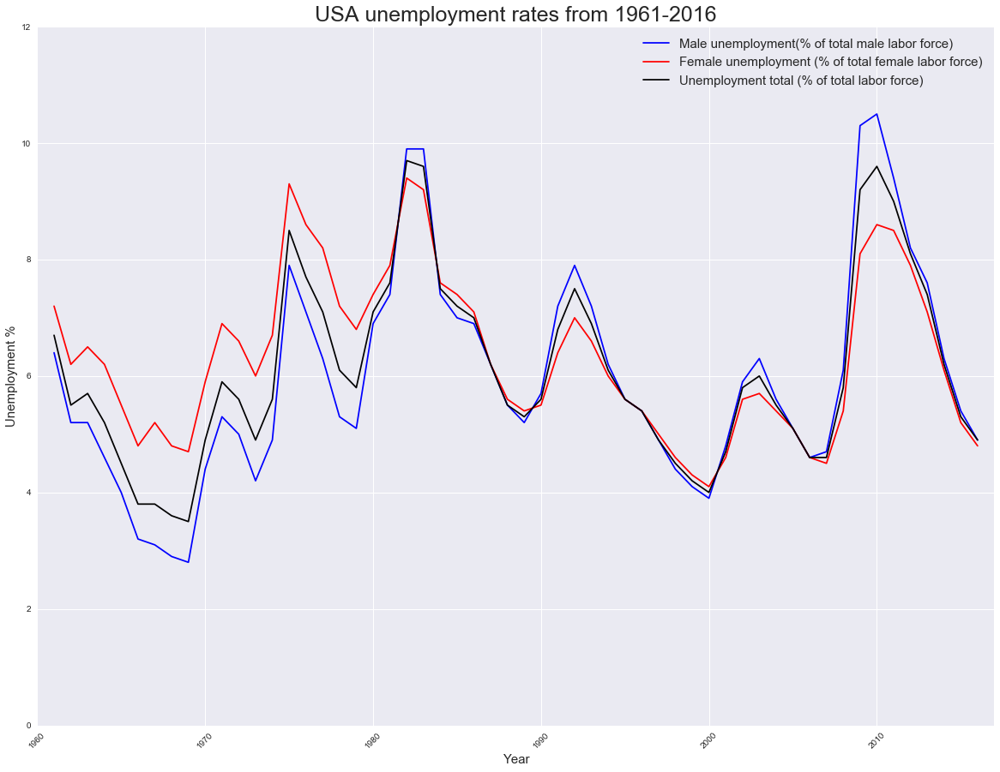

In [45]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 10
fig_size[1] = 10

_= plt.figure(figsize=(20,15))

year=pd.to_numeric(df_WB_GDP_plus['Year'], errors='coerce')
male=pd.to_numeric(df_WB_GDP_plus['Unemployment, male (% of male labor force)'], errors='coerce')
female=pd.to_numeric(df_WB_GDP_plus['Unemployment, female (% of female labor force)'], errors='coerce')
all_u=pd.to_numeric(df_WB_GDP_plus['Unemployment, total (% of total labor force)'], errors='coerce')

plt.plot(year, male, color= 'blue', label='Male unemployment(% of total male labor force)')
plt.plot(year, female , color='red', label='Female unemployment (% of total female labor force)')
plt.plot(year, all_u, color='black', label='Unemployment total (% of total labor force)')


plt.xticks(rotation=45)
plt.ylim(ymin=0, ymax=12)
plt.xlim(xmin=1960, xmax= 2017)
plt.legend(loc='upper right', fontsize=15)
plt.title('USA unemployment rates from 1961-2016', fontsize=25)
plt.xlabel('Year', fontsize=15)
plt.ylabel('Unemployment %', fontsize=15)
plt.show()

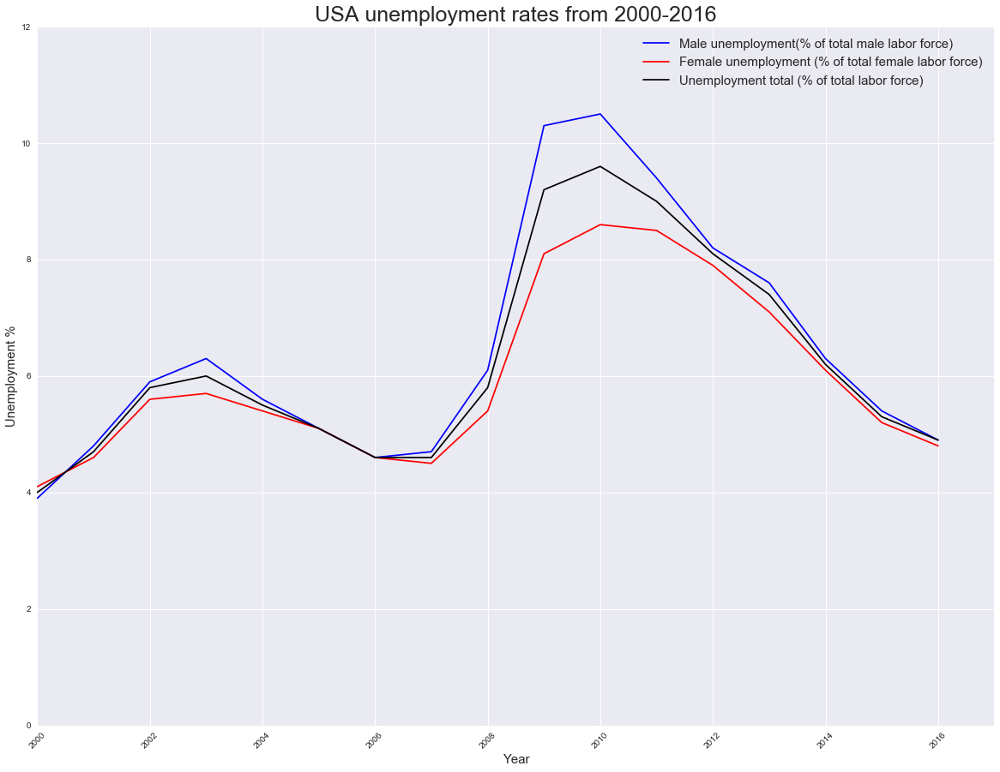

In [46]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 10
fig_size[1] = 10

_= plt.figure(figsize=(20,15))

year=pd.to_numeric(df_WB_GDP_plus['Year'], errors='coerce')
male=pd.to_numeric(df_WB_GDP_plus['Unemployment, male (% of male labor force)'], errors='coerce')
female=pd.to_numeric(df_WB_GDP_plus['Unemployment, female (% of female labor force)'], errors='coerce')
all_u=pd.to_numeric(df_WB_GDP_plus['Unemployment, total (% of total labor force)'], errors='coerce')

plt.plot(year, male, color= 'blue', label='Male unemployment(% of total male labor force)')
plt.plot(year, female , color='red', label='Female unemployment (% of total female labor force)')
plt.plot(year, all_u, color='black', label='Unemployment total (% of total labor force)')


plt.xticks(rotation=45)
plt.ylim(ymin=0, ymax=12)
plt.xlim(xmin=2000, xmax= 2017)
plt.legend(loc='upper right', fontsize=15)
plt.title('USA unemployment rates from 2000-2016', fontsize=25)
plt.xlabel('Year', fontsize=15)
plt.ylabel('Unemployment %', fontsize=15)
plt.show()

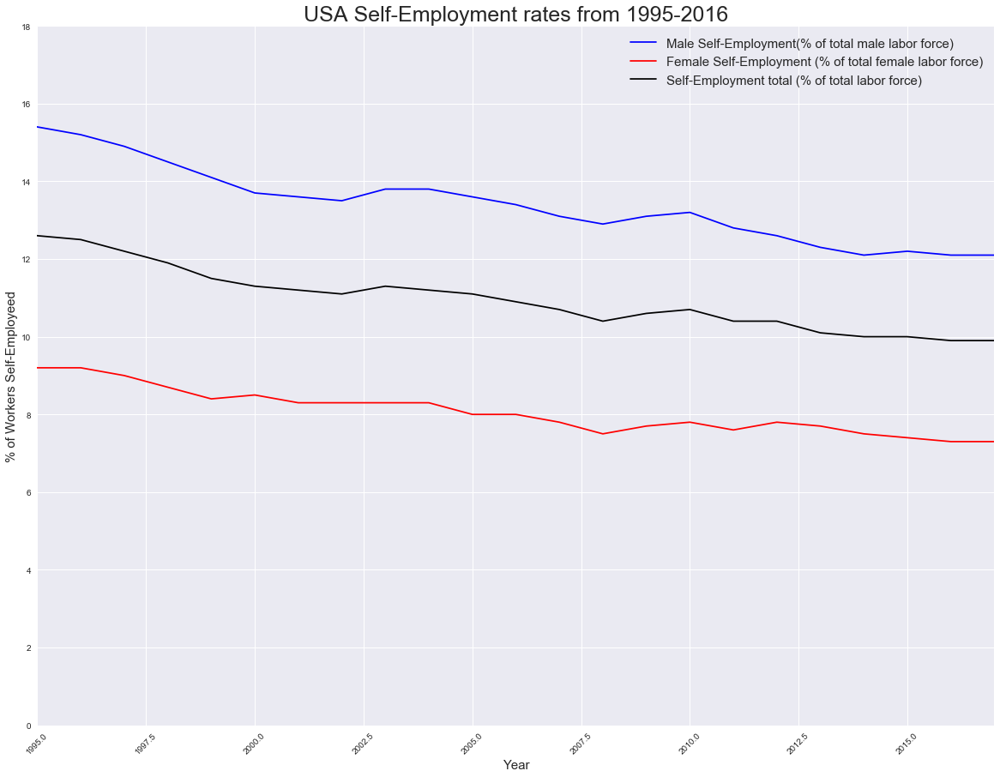

In [51]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 10
fig_size[1] = 10

_= plt.figure(figsize=(20,15))

year=pd.to_numeric(df_WB_GDP_plus['Year'], errors='coerce')
male=pd.to_numeric(df_WB_GDP_plus['% of self-employed male workers(% of all male workers)'], errors='coerce')
female=pd.to_numeric(df_WB_GDP_plus['% of self-employed female workers (% of all female workers)'], errors='coerce')
all_u=pd.to_numeric(df_WB_GDP_plus['% of self-employed workers(all)'], errors='coerce')

plt.plot(year, male, color= 'blue', label='Male Self-Employment(% of total male labor force)')
plt.plot(year, female , color='red', label='Female Self-Employment (% of total female labor force)')
plt.plot(year, all_u, color='black', label='Self-Employment total (% of total labor force)')


plt.xticks(rotation=45)
plt.ylim(ymin=0, ymax=18)
plt.xlim(xmin=1995, xmax= 2017)
plt.legend(loc='upper right', fontsize=15)
plt.title('USA Self-Employment rates from 1995-2016', fontsize=25)
plt.xlabel('Year', fontsize=15)
plt.ylabel( '% of Workers Self-Employeed', fontsize=15)
plt.show()

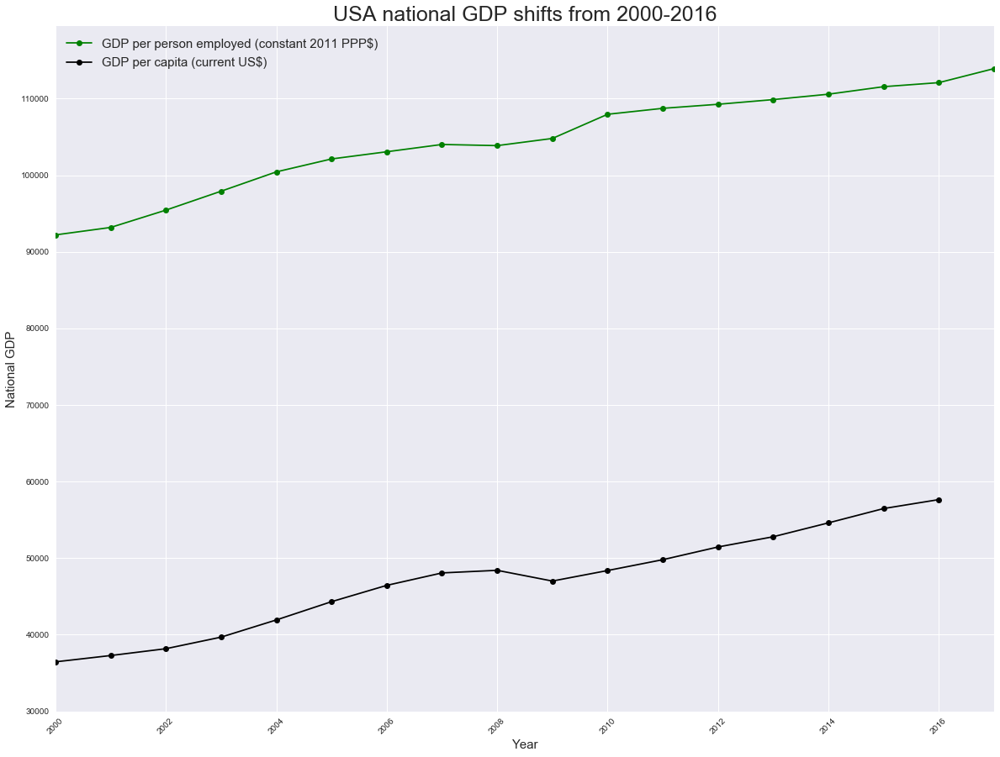

In [80]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 10
fig_size[1] = 10

_= plt.figure(figsize=(20,15))

year=pd.to_numeric(df_WB_GDP_plus['Year'], errors='coerce')
GDP_ppw=pd.to_numeric(df_WB_GDP_plus['GDP per person employed (constant 2011 PPP$)'], errors='coerce')
GDP_pc=pd.to_numeric(df_WB_GDP_plus['GDP per capita (current US$)'], errors='coerce')
GDP_g=pd.to_numeric(df_WB_GDP_plus['GDP growth (annual %)'], errors='coerce')

plt.plot(year, GDP_ppw, color= 'green', label='GDP per person employed (constant 2011 PPP$)', marker= 'o')
plt.plot(year, GDP_pc , color='black', label='GDP per capita (current US$)', marker= 'o')


plt.xticks(rotation=45)
plt.xlim(xmin=2000, xmax= 2017)
plt.ylim(ymin=30000)
plt.legend(loc='best', fontsize=15)
plt.title('USA national GDP shifts from 2000-2016', fontsize=25)
plt.xlabel('Year', fontsize=15)
plt.ylabel( 'National GDP', fontsize=15)
plt.show()

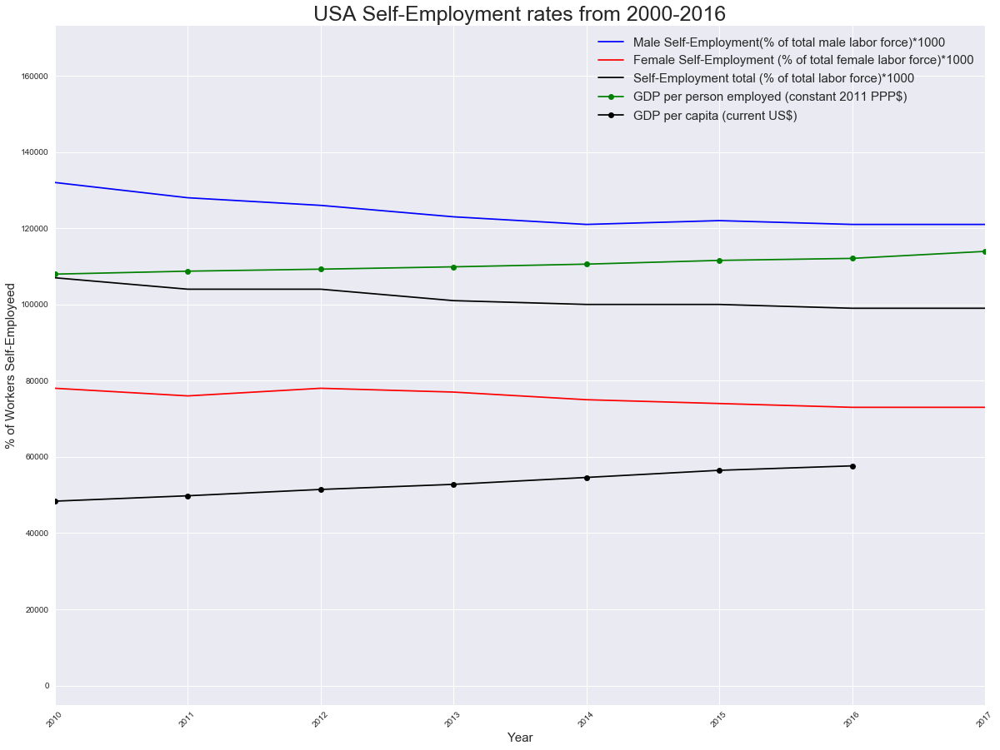

In [68]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 10
fig_size[1] = 10

_= plt.figure(figsize=(20,15))

year=pd.to_numeric(df_WB_GDP_plus['Year'], errors='coerce')
male=pd.to_numeric(df_WB_GDP_plus['% of self-employed male workers(% of all male workers)'], errors='coerce')
female=pd.to_numeric(df_WB_GDP_plus['% of self-employed female workers (% of all female workers)'], errors='coerce')
all_u=pd.to_numeric(df_WB_GDP_plus['% of self-employed workers(all)'], errors='coerce')

plt.plot(year, male*10000, color= 'blue', label='Male Self-Employment(% of total male labor force)*1000')
plt.plot(year, female*10000 , color='red', label='Female Self-Employment (% of total female labor force)*1000')
plt.plot(year, all_u*10000, color='black', label='Self-Employment total (% of total labor force)*1000')

GDP_ppw=pd.to_numeric(df_WB_GDP_plus['GDP per person employed (constant 2011 PPP$)'], errors='coerce')
GDP_pc=pd.to_numeric(df_WB_GDP_plus['GDP per capita (current US$)'], errors='coerce')

plt.plot(year, GDP_ppw, color= 'green', label='GDP per person employed (constant 2011 PPP$)', marker= 'o')
plt.plot(year, GDP_pc, color='black', label='GDP per capita (current US$)', marker= 'o')


plt.xticks(rotation=45)
plt.xlim(xmin=2010, xmax= 2017)
plt.legend(loc='upper right', fontsize=15)
plt.title('USA Self-Employment rates from 2000-2016', fontsize=25)
plt.xlabel('Year', fontsize=15)
plt.ylabel( '% of Workers Self-Employeed', fontsize=15)
plt.show()